In [1]:
pip install rasterio numpy pandas matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 75.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


# **R2F01JAN2025071113010900054**

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 181MB, Available: 30973MB
📂 Loading TOA data efficiently from TIF: R2F01JAN2025071113010900054_TOA.tif
   TIF shape: (3, 16085, 18486)
   TIF data type: float32
   Converted shape: (16085, 18486, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16085, 18486, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3403MB
📊 After loading TOA data from TIF: Using 3600MB, Available: 27502MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 304 chunks of size 1024x1024
   Processed 20/304 chunks
   Processed 40/304 chunks
   Processed 60/304 chunks
   Processed 80/304 chunks
   Processed 100/304 chunks
   Processed 120/304 chunks
   Processed 140/304 chunks
   Processed 160/304 chunks
   Processed 180/304 chunks
   Proce

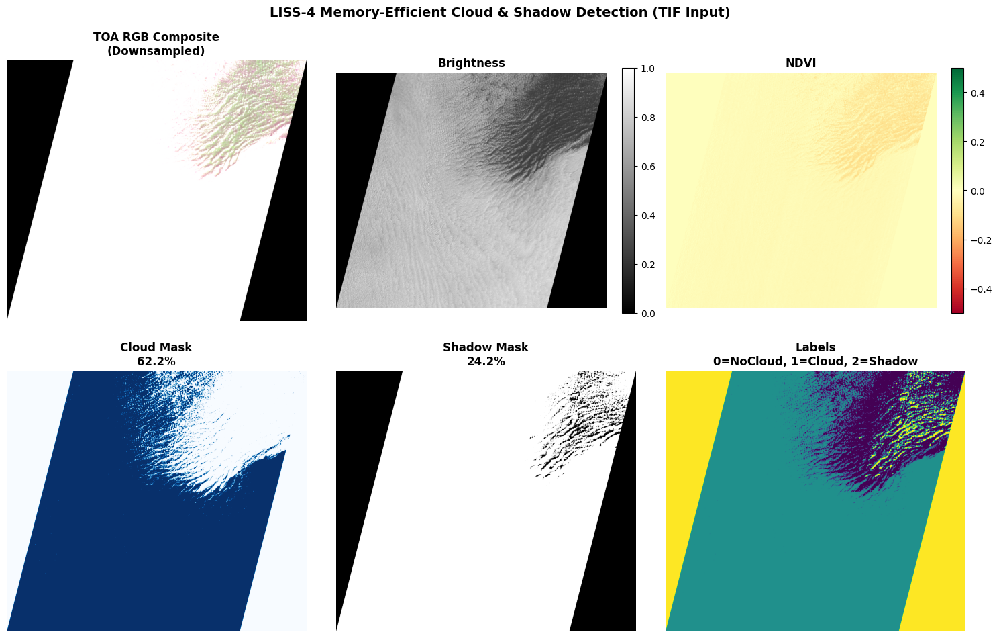

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 801MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/R2F01JAN2025071113010900054
📊 After patch generation: Using 7936MB, Availa

In [2]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.55,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.25,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/R2F01JAN2025071113010900054")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/R2F01JAN2025071113010900054_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# R2F05AUG2024068996010800054

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 7936MB, Available: 23144MB
📂 Loading TOA data efficiently from TIF: R2F05AUG2024068996010800054_TOA.tif
   TIF shape: (3, 16790, 17937)
   TIF data type: float32
   Converted shape: (16790, 17937, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16790, 17937, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3447MB
📊 After loading TOA data from TIF: Using 11377MB, Available: 19723MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 306 chunks of size 1024x1024
   Processed 20/306 chunks
   Processed 40/306 chunks
   Processed 60/306 chunks
   Processed 80/306 chunks
   Processed 100/306 chunks
   Processed 120/306 chunks
   Processed 140/306 chunks
   Processed 160/306 chunks
   Processed 180/306 chunks
   Pro

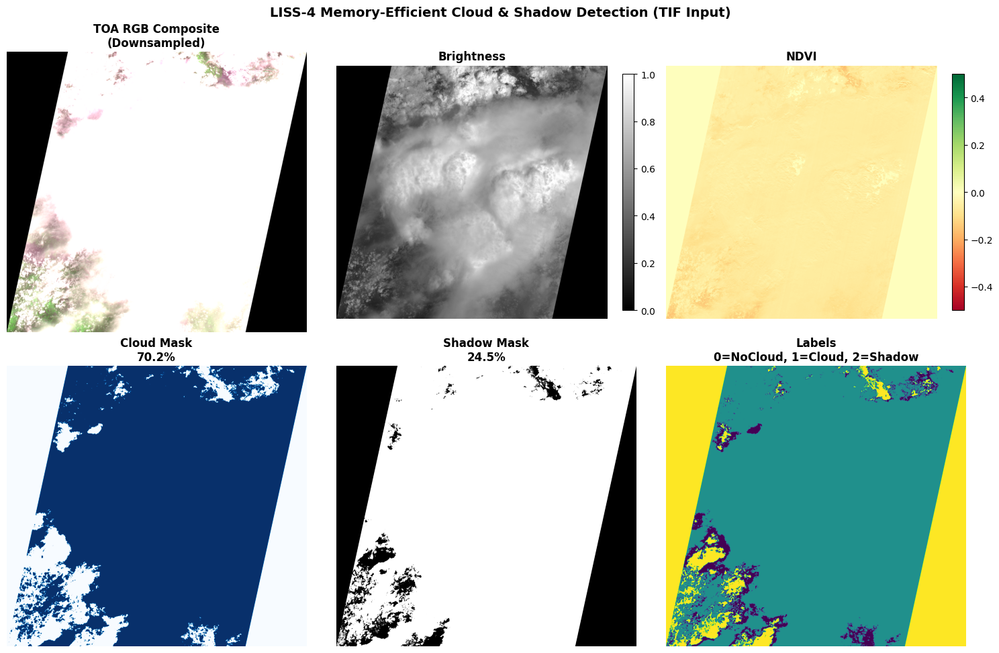

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 982MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/R2F05AUG2024068996010800054
📊 After patch generation: Using 8059MB, Availa

In [3]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.3,     # Slightly reduced 
            'red_threshold': 0.4,            # Slightly reduced
            'green_threshold': 0.4,          # Slightly reduced
            'nir_threshold': 0.3,            # Slightly reduced
            'ndvi_threshold': 0.1,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.25,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & ( high_red | high_green | moderate_nir ) & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/R2F05AUG2024068996010800054")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/R2F05AUG2024068996010800054_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# RAF08MAY2024038491010700053


🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 8059MB, Available: 23025MB
📂 Loading TOA data efficiently from TIF: RAF08MAY2024038491010700053_TOA.tif
   TIF shape: (3, 16735, 17891)
   TIF data type: float32
   Converted shape: (16735, 17891, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16735, 17891, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3426MB
📊 After loading TOA data from TIF: Using 11456MB, Available: 19658MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 306 chunks of size 1024x1024
   Processed 20/306 chunks
   Processed 40/306 chunks
   Processed 60/306 chunks
   Processed 80/306 chunks
   Processed 100/306 chunks
   Processed 120/306 chunks
   Processed 140/306 chunks
   Processed 160/306 chunks
   Processed 180/306 chunks
   Pro

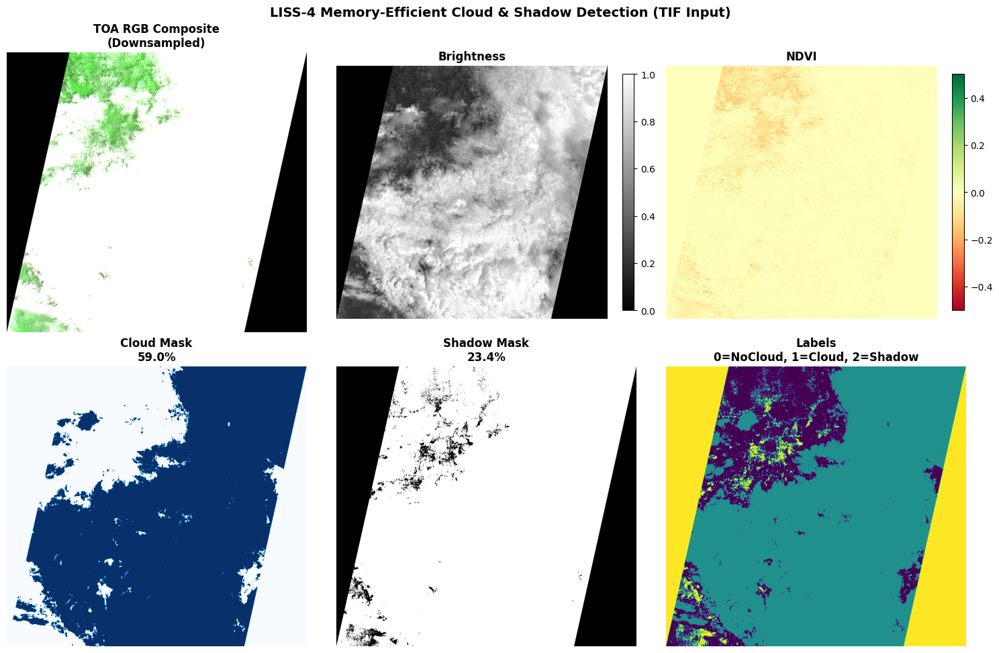

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1136MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/RAF08MAY2024038491010700053
📊 After patch generation: Using 8014MB, Avail

In [4]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.55,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.25,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/RAF08MAY2024038491010700053")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF08MAY2024038491010700053_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# RAF16SEP2024040353009000054

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 8014MB, Available: 23069MB
📂 Loading TOA data efficiently from TIF: RAF16SEP2024040353009000054_TOA.tif
   TIF shape: (3, 16684, 17901)
   TIF data type: float32
   Converted shape: (16684, 17901, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16684, 17901, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3418MB
📊 After loading TOA data from TIF: Using 11402MB, Available: 19703MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 306 chunks of size 1024x1024
   Processed 20/306 chunks
   Processed 40/306 chunks
   Processed 60/306 chunks
   Processed 80/306 chunks
   Processed 100/306 chunks
   Processed 120/306 chunks
   Processed 140/306 chunks
   Processed 160/306 chunks
   Processed 180/306 chunks
   Pro

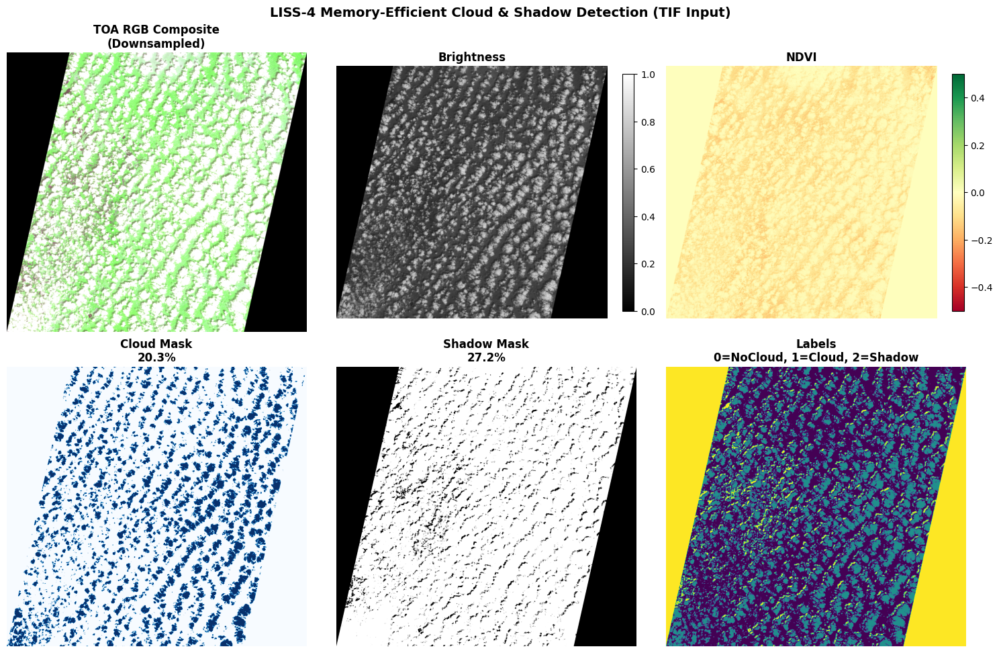

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1196MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/RAF16SEP2024040353009000054
📊 After patch generation: Using 7996MB, Avail

In [5]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.45,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.2,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/RAF16SEP2024040353009000054")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF16SEP2024040353009000054_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# RAF18AUG2024039941008900053

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 7996MB, Available: 23053MB
📂 Loading TOA data efficiently from TIF: RAF18AUG2024039941008900053_TOA.tif
   TIF shape: (3, 16620, 18001)
   TIF data type: float32
   Converted shape: (16620, 18001, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16620, 18001, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3424MB
📊 After loading TOA data from TIF: Using 11389MB, Available: 19735MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 306 chunks of size 1024x1024
   Processed 20/306 chunks
   Processed 40/306 chunks
   Processed 60/306 chunks
   Processed 80/306 chunks
   Processed 100/306 chunks
   Processed 120/306 chunks
   Processed 140/306 chunks
   Processed 160/306 chunks
   Processed 180/306 chunks
   Pro

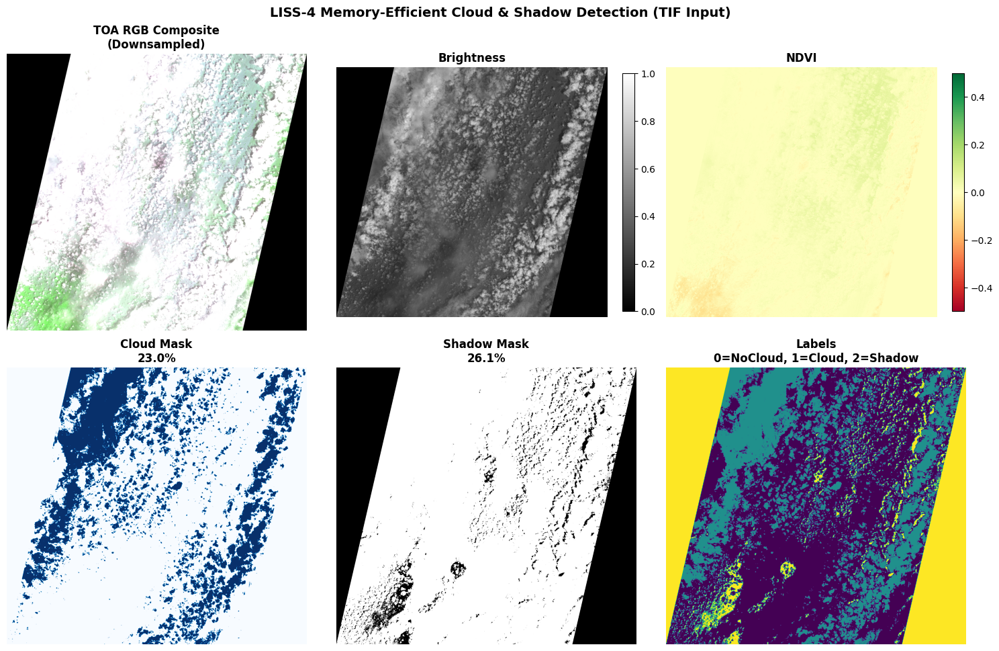

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1186MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/RAF18AUG2024039941008900053
📊 After patch generation: Using 7989MB, Avail

In [6]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.45,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.23,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/RAF18AUG2024039941008900053")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF18AUG2024039941008900053_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# RAF22JUN2024039131009200052

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 7990MB, Available: 23059MB
📂 Loading TOA data efficiently from TIF: RAF22JUN2024039131009200052_TOA.tif
   TIF shape: (3, 16146, 18398)
   TIF data type: float32
   Converted shape: (16146, 18398, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16146, 18398, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3400MB
📊 After loading TOA data from TIF: Using 11702MB, Available: 19402MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 288 chunks of size 1024x1024
   Processed 20/288 chunks
   Processed 40/288 chunks
   Processed 60/288 chunks
   Processed 80/288 chunks
   Processed 100/288 chunks
   Processed 120/288 chunks
   Processed 140/288 chunks
   Processed 160/288 chunks
   Processed 180/288 chunks
   Pro

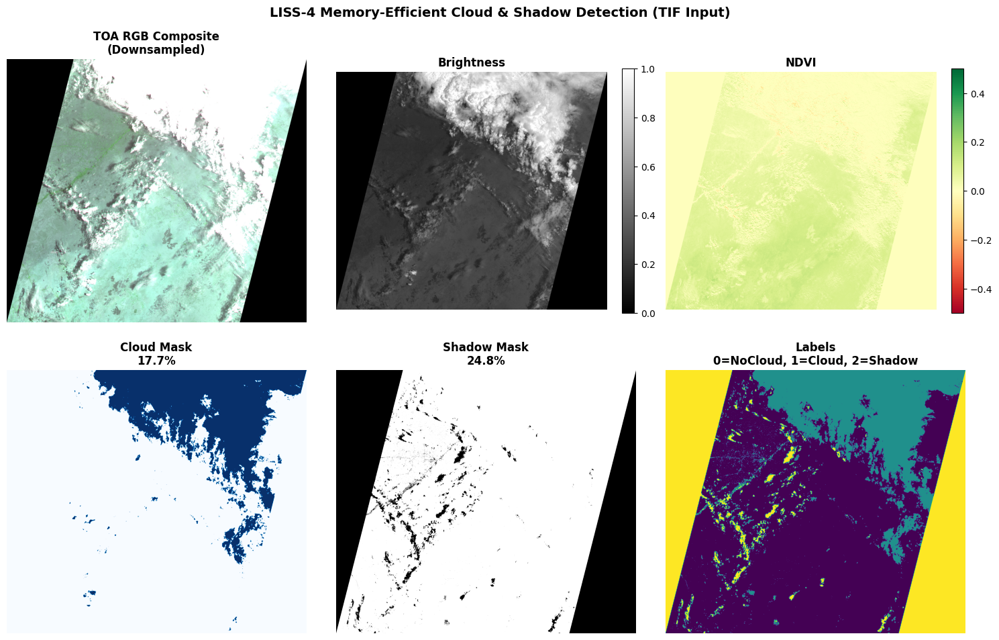

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1040MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/RAF22JUN2024039131009200052
📊 After patch generation: Using 7993MB, Avail

In [7]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.35,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.17,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/RAF22JUN2024039131009200052")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF22JUN2024039131009200052_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# RAF28AUG2024040083009100054

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 7993MB, Available: 23103MB
📂 Loading TOA data efficiently from TIF: RAF28AUG2024040083009100054_TOA.tif
   TIF shape: (3, 16864, 17764)
   TIF data type: float32
   Converted shape: (16864, 17764, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16864, 17764, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3428MB
📊 After loading TOA data from TIF: Using 11339MB, Available: 19753MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 306 chunks of size 1024x1024
   Processed 20/306 chunks
   Processed 40/306 chunks
   Processed 60/306 chunks
   Processed 80/306 chunks
   Processed 100/306 chunks
   Processed 120/306 chunks
   Processed 140/306 chunks
   Processed 160/306 chunks
   Processed 180/306 chunks
   Pro

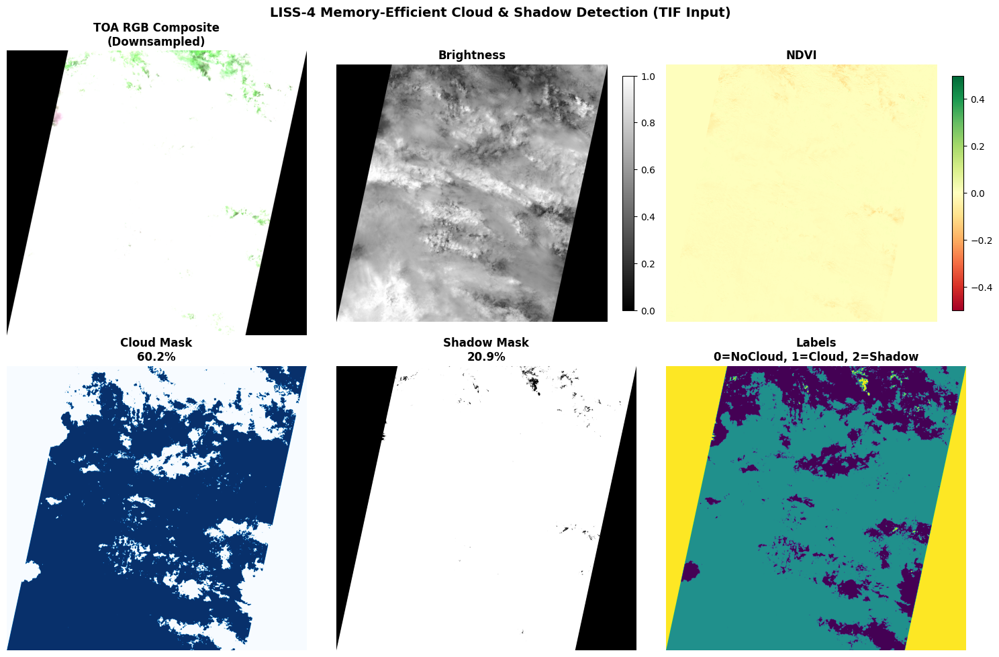

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1041MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/RAF28AUG2024040083009100054
📊 After patch generation: Using 7987MB, Avail

In [8]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.55,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.25,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/RAF28AUG2024040083009100054")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF28AUG2024040083009100054_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# RAF30JUL2024039671009000054

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 7987MB, Available: 23049MB
📂 Loading TOA data efficiently from TIF: RAF30JUL2024039671009000054_TOA.tif
   TIF shape: (3, 16672, 17901)
   TIF data type: float32
   Converted shape: (16672, 17901, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16672, 17901, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3415MB
📊 After loading TOA data from TIF: Using 11404MB, Available: 19678MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 306 chunks of size 1024x1024
   Processed 20/306 chunks
   Processed 40/306 chunks
   Processed 60/306 chunks
   Processed 80/306 chunks
   Processed 100/306 chunks
   Processed 120/306 chunks
   Processed 140/306 chunks
   Processed 160/306 chunks
   Processed 180/306 chunks
   Pro

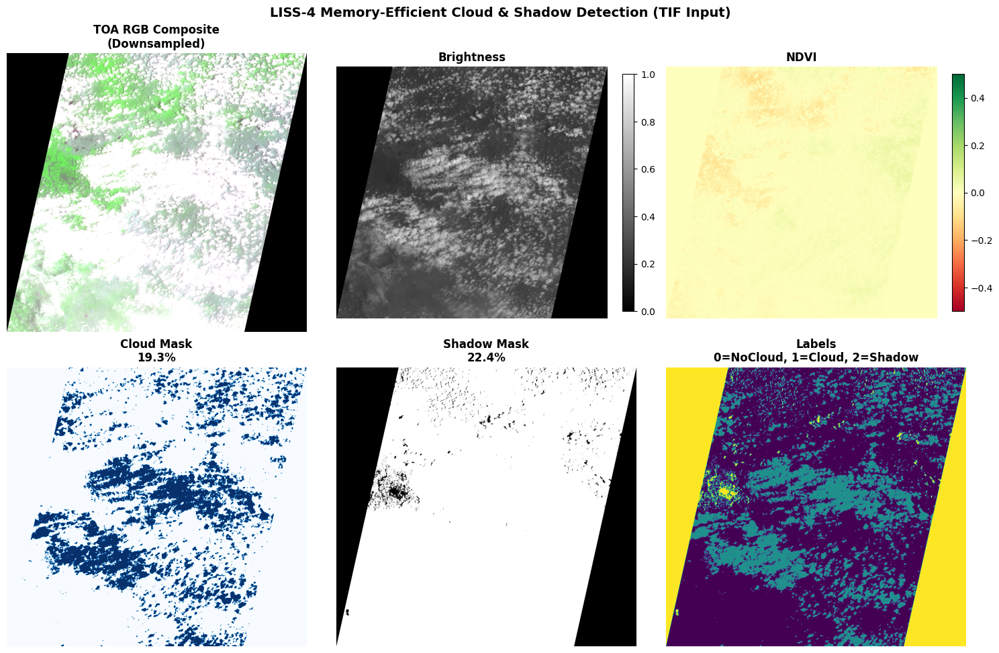

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1120MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/RAF30JUL2024039671009000054
📊 After patch generation: Using 7947MB, Avail

In [9]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.35,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.2,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # Not water (avoid false positives)
        not_water = self.ndwi < 0.3
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/RAF30JUL2024039671009000054")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF30JUL2024039671009000054_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# Cloud cover with marshy/water bodies (lakes/rivers/ocean)


# R2F01SEP2024069380009900053


🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 7948MB, Available: 23116MB
📂 Loading TOA data efficiently from TIF: R2F01SEP2024069380009900053_TOA.tif
   TIF shape: (3, 16125, 18206)
   TIF data type: float32
   Converted shape: (16125, 18206, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16125, 18206, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3360MB
📊 After loading TOA data from TIF: Using 11323MB, Available: 19737MB
⚙️ Setting up optimized detection parameters...
   Optimized for memory and better shadow detection
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 288 chunks of size 1024x1024
   Processed 20/288 chunks
   Processed 40/288 chunks
   Processed 60/288 chunks
   Processed 80/288 chunks
   Processed 100/288 chunks
   Processed 120/288 chunks
   Processed 140/288 chunks
   Processed 160/288 chunks
   Processed 180/288 chunks
   Pro

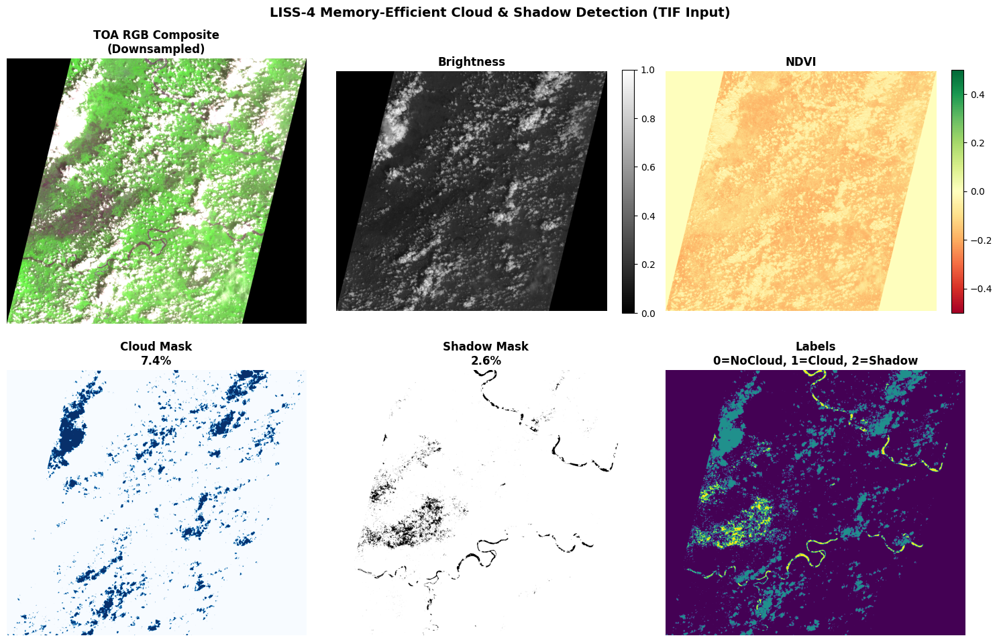

✅ Visualization complete and memory cleaned
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1111MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/R2F01SEP2024069380009900053
📊 After patch generation: Using 7809MB, Avail

In [10]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - adjusted for better shadow detection"""
        print("⚙️ Setting up optimized detection parameters...")
        
        # Improved cloud detection parameters
        self.cloud_params = {
            'brightness_threshold': 0.2,     # Slightly reduced 
            'red_threshold': 0.45,            # Slightly reduced
            'green_threshold': 0.45,          # Slightly reduced
            'nir_threshold': 0.35,            # Slightly reduced
            'ndvi_threshold': 0.4,            # Increased for better vegetation separation
            'morphology_disk_size': 2         # Reduced for efficiency
        }
        
        # Improved shadow detection parameters (less strict)
        self.shadow_params = {
            'darkness_threshold': 0.2,       # Increased from 0.15
            'red_threshold': 0.3,             # Increased from 0.2
            'green_threshold': 0.3,           # Increased from 0.2
            'nir_threshold': 0.35,            # Increased from 0.25
            'ndvi_threshold': 0.1,            # Much less strict
            'morphology_disk_size': 1         # Smaller for efficiency
        }
        
        print(f"   Optimized for memory and better shadow detection")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with relaxed thresholds"""
        print("🌑 Detecting shadows with improved parameters...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply relaxed shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        water_candidates = (
            (self.ndwi > 0.1) |                           # Lower NDWI threshold for water
            ((self.ndvi < 0.0) & (self.brightness < 0.11)) |  # Dark water with slight NDWI
            ((self.ndvi < 0.1) & (nir < 0.05))           # Very low vegetation + low NIR = water
        )
        # Not water (avoid false positives)
        not_water = ~water_candidates
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # Combine criteria
        shadow_candidates = dark_pixels & low_red & low_green & low_nir & low_ndvi & not_water & not_cloud
        
        # Light morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=15)
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        print(f"✅ Shadow detection: {shadow_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization to avoid memory issues"""
        print(f"📊 Creating memory-efficient visualization (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # Cloud mask
        axes[1,0].imshow(cloud_small, cmap='Blues', vmin=0, vmax=1)
        axes[1,0].set_title(f'Cloud Mask\n{np.sum(self.cloud_mask)/self.cloud_mask.size*100:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Shadow mask
        axes[1,1].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        axes[1,1].set_title(f'Shadow Mask\n{np.sum(self.shadow_mask)/self.shadow_mask.size*100:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Final labels
        axes[1,2].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,2].set_title('Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,2].axis('off')
        
        plt.suptitle('LISS-4 Memory-Efficient Cloud & Shadow Detection (TIF Input)', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('memory_efficient_results_tif.png', dpi=100, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Visualization complete and memory cleaned")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/R2F01SEP2024069380009900053")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/R2F01SEP2024069380009900053_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 7809MB, Available: 23227MB
📂 Loading TOA data efficiently from TIF: R2F01SEP2024069380009900053_TOA.tif
   TIF shape: (3, 16125, 18206)
   TIF data type: float32
   Converted shape: (16125, 18206, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16125, 18206, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3360MB
📊 After loading TOA data from TIF: Using 11169MB, Available: 19870MB
⚙️ Setting up ultra-conservative detection parameters...
   Ultra-conservative parameters set for better water/shadow separation
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 288 chunks of size 1024x1024
   Processed 20/288 chunks
   Processed 40/288 chunks
   Processed 60/288 chunks
   Processed 80/288 chunks
   Processed 100/288 chunks
   Processed 120/288 chunks
   Processed 140/288 chunks
   Processed 160/288 chunks
   Pr

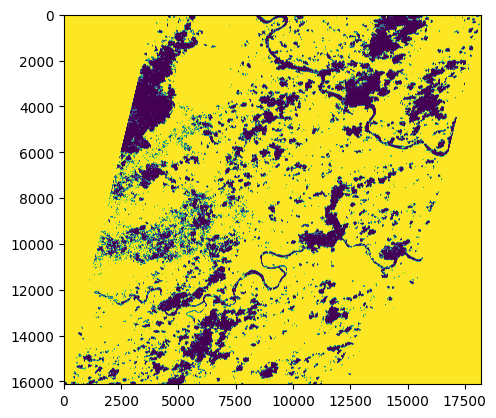

✅ Improved shadow detection: 0.38% of image
💧 Water bodies detected: 82.67% of image
📊 After shadow detection: Using 11208MB, Available: 19810MB
🏷️ Creating final label mask...
✅ Final label statistics:
   NOCLOUD (0): 278,295,695 pixels (94.80%)
   CLOUD (1): 14,165,525 pixels (4.83%)
   SHADOW (2): 1,110,530 pixels (0.38%)
📊 After label creation: Using 8331MB, Available: 22701MB
📊 Creating improved visualization with water analysis (downsampled by 8x)...
   Visualization size: 2015x2275 (reduced from 16125x18206)


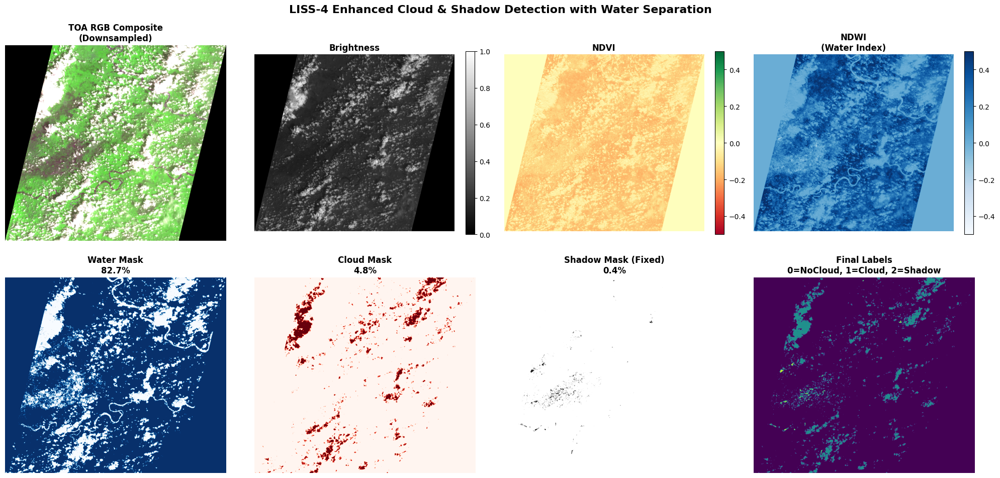

✅ Enhanced visualization complete with water analysis
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 1111MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/R2F01SEP2024069380009900053
📊 After patch generation: Using 803

In [11]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - ULTRA CONSERVATIVE for shadow detection"""
        print("⚙️ Setting up ultra-conservative detection parameters...")
        
        # Cloud detection parameters (keep same)
        self.cloud_params = {
            'brightness_threshold': 0.55,
            'red_threshold': 0.45,
            'green_threshold': 0.45,
            'nir_threshold': 0.35,
            'ndvi_threshold': 0.4,
            'morphology_disk_size': 2
        }
        
        # ULTRA-CONSERVATIVE shadow detection parameters
        self.shadow_params = {
            'darkness_threshold': 0.12,       # Much more strict
            'red_threshold': 0.15,            # Much more strict
            'green_threshold': 0.15,          # Much more strict
            'nir_threshold': 0.15,            # Much more strict
            'ndvi_threshold': 0.0,            # Only negative NDVI
            'morphology_disk_size': 1
        }
        
        print(f"   Ultra-conservative parameters set for better water/shadow separation")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with improved water handling"""
        print("🌑 Detecting shadows with improved water separation...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # IMPROVED WATER DETECTION - More comprehensive
        water_candidates = (
            (self.ndwi > 0.1) |                           # Lower NDWI threshold for water
            ((self.ndvi < 0.0) & (self.brightness < 0.11)) |  # Dark water with slight NDWI
            ((self.ndvi < 0.1) & (nir < 0.05))           # Very low vegetation + low NIR = water
        )
        
        # Clean up water detection
        water_candidates = morphology.remove_small_objects(water_candidates, min_size=100)
        water_candidates = morphology.closing(water_candidates, morphology.disk(3))
        not_water = ~water_candidates
        
        # IMPROVED VEGETATION EXCLUSION
        vegetation_candidates = (
            (self.ndvi > 0.15) |                          # Clear vegetation
            ((self.ndvi > 0.05) & (nir > 0.25)) |        # Moderate vegetation
            ((self.ndvi > 0.0) & (nir > 0.4))            # High NIR indicates vegetation
        )
        not_vegetation = ~vegetation_candidates
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # ULTRA-CONSERVATIVE shadow detection
        shadow_candidates = (
            dark_pixels & 
            low_red & 
            low_green & 
            low_nir & 
            (self.ndvi < 0.0) &           # Only negative NDVI (definitely not vegetation)
            (self.brightness < 0.15) &    # Extra dark requirement
            not_water & 
            not_vegetation &
            not_cloud
        )
        
        # Aggressive morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=50)  # Larger minimum size
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        # Store water mask for analysis
        self.water_mask = water_candidates.astype(np.uint8)
        plt.imshow(water_candidates)
        plt.show()
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        water_percentage = (np.sum(self.water_mask) / self.water_mask.size) * 100
        
        print(f"✅ Improved shadow detection: {shadow_percentage:.2f}% of image")
        print(f"💧 Water bodies detected: {water_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization with water analysis"""
        print(f"📊 Creating improved visualization with water analysis (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        ndwi_small = self.ndwi[::downsample_factor, ::downsample_factor]
        water_small = self.water_mask[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create enhanced visualization
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # NDWI (NEW)
        im3 = axes[0,3].imshow(ndwi_small, cmap='Blues', vmin=-0.5, vmax=0.5)
        axes[0,3].set_title('NDWI\n(Water Index)', fontweight='bold')
        axes[0,3].axis('off')
        plt.colorbar(im3, ax=axes[0,3], fraction=0.046, shrink=0.8)
        
        # Water mask (NEW)
        axes[1,0].imshow(water_small, cmap='Blues', vmin=0, vmax=1)
        water_pct = np.sum(self.water_mask)/self.water_mask.size*100
        axes[1,0].set_title(f'Water Mask\n{water_pct:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Cloud mask
        axes[1,1].imshow(cloud_small, cmap='Reds', vmin=0, vmax=1)
        cloud_pct = np.sum(self.cloud_mask)/self.cloud_mask.size*100
        axes[1,1].set_title(f'Cloud Mask\n{cloud_pct:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Shadow mask (IMPROVED)
        axes[1,2].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        shadow_pct = np.sum(self.shadow_mask)/self.shadow_mask.size*100
        axes[1,2].set_title(f'Shadow Mask (Fixed)\n{shadow_pct:.1f}%', fontweight='bold')
        axes[1,2].axis('off')
        
        # Final labels
        axes[1,3].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,3].set_title('Final Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,3].axis('off')
        
        plt.suptitle('LISS-4 Enhanced Cloud & Shadow Detection with Water Separation', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.savefig('improved_water_shadow_results.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, ndwi_small, water_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Enhanced visualization complete with water analysis")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/R2F01SEP2024069380009900053")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/R2F01SEP2024069380009900053_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# R2F02FEB2025071568010100068


🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)
📊 Initial: Using 8037MB, Available: 22976MB
📂 Loading TOA data efficiently from TIF: R2F02FEB2025071568010100068_TOA.tif
   TIF shape: (3, 16190, 17959)
   TIF data type: float32
   Converted shape: (16190, 17959, 3)
✅ TOA Data loaded efficiently from TIF:
   Final shape: (16190, 17959, 3)
   Data type: float32
   Value range: [0.0000, 1.0000]
   Memory usage: ~3327MB
📊 After loading TOA data from TIF: Using 11349MB, Available: 19710MB
⚙️ Setting up ultra-conservative detection parameters...
   Ultra-conservative parameters set for better water/shadow separation
🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)
🔬 Calculating spectral indices in memory-efficient chunks...
   Processing 288 chunks of size 1024x1024
   Processed 20/288 chunks
   Processed 40/288 chunks
   Processed 60/288 chunks
   Processed 80/288 chunks
   Processed 100/288 chunks
   Processed 120/288 chunks
   Processed 140/288 chunks
   Processed 160/288 chunks
   Pr

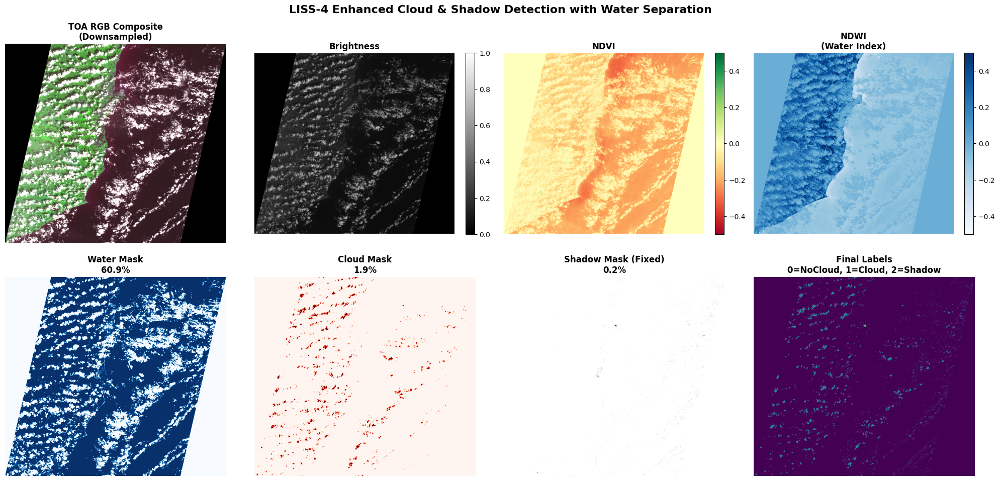

✅ Enhanced visualization complete with water analysis
💾 Saving TIF data as NPZ format: toa_from_tif_converted.npz
✅ NPZ file saved: toa_from_tif_converted.npz
   Size: 924MB
✂️ Generating patches efficiently (max 2000 patches)
   Patch size: 256x256
   Step size: 192 (overlap: 25%)
   Generated 100 patches...
   Generated 200 patches...
   Generated 300 patches...
   Generated 400 patches...
   Generated 500 patches...
   Generated 600 patches...
   Generated 700 patches...
   Generated 800 patches...
   Generated 900 patches...
   Generated 1000 patches...
   Generated 1100 patches...
   Generated 1200 patches...
   Generated 1300 patches...
   Generated 1400 patches...
   Generated 1500 patches...
   Generated 1600 patches...
   Generated 1700 patches...
   Generated 1800 patches...
   Generated 1900 patches...
   Generated 2000 patches...
✅ Generated 2000 patches in 41 batches
📁 Saved to: training_patches_efficient_tif/R2F02FEB2025071568010100068
📊 After patch generation: Using 7979

In [12]:
#!/usr/bin/env python3
"""
MEMORY-EFFICIENT LISS-4 Label Generator
Handles large images without memory overflow - TIF INPUT VERSION
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage import morphology
from pathlib import Path
import json
import gc
import psutil
import warnings
warnings.filterwarnings('ignore')

class MemoryEfficientLabelGenerator:
    """
    Memory-efficient ground truth generation for LISS-4 cloud detection
    TIF INPUT VERSION
    """
    
    def __init__(self, toa_data_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif"):
        """Initialize with memory monitoring - TIF INPUT"""
        print("🏷️ Memory-Efficient LISS-4 Label Generator (TIF Input)")
        self.monitor_memory("Initial")
        
        # Load TOA data efficiently from TIF
        self.load_toa_data_efficient_from_tif(toa_data_path)
        self.setup_detection_parameters()
        
    def monitor_memory(self, step_name):
        """Monitor memory usage"""
        try:
            process = psutil.Process()
            memory_mb = process.memory_info().rss / 1024 / 1024
            available_mb = psutil.virtual_memory().available / 1024 / 1024
            print(f"📊 {step_name}: Using {memory_mb:.0f}MB, Available: {available_mb:.0f}MB")
        except:
            print(f"📊 {step_name}: Memory monitoring unavailable")
    
    def load_toa_data_efficient_from_tif(self, toa_path):
        """Load TOA data from TIF with memory optimization"""
        print(f"📂 Loading TOA data efficiently from TIF: {Path(toa_path).name}")
        
        # Load TIF data using rasterio
        with rasterio.open(toa_path) as src:
            # Read all bands
            toa_bands = src.read()  # Shape: (bands, height, width)
            
            print(f"   TIF shape: {toa_bands.shape}")
            print(f"   TIF data type: {toa_bands.dtype}")
            
            # Convert to (height, width, bands) format like the original NPZ
            toa_full = np.transpose(toa_bands, (1, 2, 0))
            
            # Store geospatial info for later use
            self.geospatial_info = {
                'transform': src.transform,
                'crs': src.crs,
                'bounds': src.bounds
            }
        
        # Get dimensions
        self.height, self.width, self.n_bands = toa_full.shape
        print(f"   Converted shape: {toa_full.shape}")
        
        # Handle scaling if needed (check if values are in 0-10000 range)
        max_val = np.nanmax(toa_full)
        if max_val > 1.0:
            if max_val > 10:
                print(f"   📏 Scaling from 0-{max_val:.0f} to 0-1")
                toa_full = toa_full / 10000.0
            else:
                print(f"   📏 Scaling from 0-{max_val:.2f} to 0-1")
                toa_full = toa_full / max_val
        
        # Handle 4th band issue - use only first 3 bands
        if self.n_bands == 4:
            print("   ⚠️ Found 4 bands, using first 3 (Red, NIR, Green)")
            toa_full = toa_full[:,:,:3]
            self.n_bands = 3
        elif self.n_bands < 3:
            raise ValueError(f"Need at least 3 bands, found {self.n_bands}")
        
        # Convert to float32 to save memory (vs float64)
        self.toa_image = toa_full.astype(np.float32)
        
        # Clean up
        del toa_bands, toa_full
        gc.collect()
        
        print(f"✅ TOA Data loaded efficiently from TIF:")
        print(f"   Final shape: {self.toa_image.shape}")
        print(f"   Data type: {self.toa_image.dtype}")
        print(f"   Value range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
        print(f"   Memory usage: ~{self.toa_image.nbytes / 1024 / 1024:.0f}MB")
        
        self.monitor_memory("After loading TOA data from TIF")
        
    def setup_detection_parameters(self):
        """Setup detection parameters - ULTRA CONSERVATIVE for shadow detection"""
        print("⚙️ Setting up ultra-conservative detection parameters...")
        
        # Cloud detection parameters (keep same)
        self.cloud_params = {
            'brightness_threshold': 0.55,
            'red_threshold': 0.45,
            'green_threshold': 0.45,
            'nir_threshold': 0.35,
            'ndvi_threshold': 0.4,
            'morphology_disk_size': 2
        }
        
        # ULTRA-CONSERVATIVE shadow detection parameters
        self.shadow_params = {
            'darkness_threshold': 0.12,       # Much more strict
            'red_threshold': 0.15,            # Much more strict
            'green_threshold': 0.15,          # Much more strict
            'nir_threshold': 0.15,            # Much more strict
            'ndvi_threshold': 0.0,            # Only negative NDVI
            'morphology_disk_size': 1
        }
        
        print(f"   Ultra-conservative parameters set for better water/shadow separation")
        
    def calculate_indices_chunked(self, chunk_size=2048):
        """Calculate spectral indices in chunks to save memory"""
        print("🔬 Calculating spectral indices in memory-efficient chunks...")
        
        # Initialize output arrays
        self.ndvi = np.zeros((self.height, self.width), dtype=np.float32)
        self.ndwi = np.zeros((self.height, self.width), dtype=np.float32)
        self.brightness = np.zeros((self.height, self.width), dtype=np.float32)
        
        # Process in chunks
        n_chunks_y = (self.height + chunk_size - 1) // chunk_size
        n_chunks_x = (self.width + chunk_size - 1) // chunk_size
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"   Processing {total_chunks} chunks of size {chunk_size}x{chunk_size}")
        
        chunk_count = 0
        for i in range(0, self.height, chunk_size):
            for j in range(0, self.width, chunk_size):
                # Define chunk boundaries
                end_i = min(i + chunk_size, self.height)
                end_j = min(j + chunk_size, self.width)
                
                # Extract chunk
                chunk = self.toa_image[i:end_i, j:end_j, :]
                
                # Calculate indices for this chunk
                red = chunk[:,:,0]
                nir = chunk[:,:,1]
                green = chunk[:,:,2]
                
                # NDVI
                self.ndvi[i:end_i, j:end_j] = (nir - red) / (nir + red + 1e-8)
                
                # NDWI
                self.ndwi[i:end_i, j:end_j] = (green - nir) / (green + nir + 1e-8)
                
                # Brightness
                self.brightness[i:end_i, j:end_j] = (red + nir + green) / 3
                
                chunk_count += 1
                if chunk_count % 20 == 0:
                    print(f"   Processed {chunk_count}/{total_chunks} chunks")
        
        print(f"✅ Spectral indices calculated:")
        print(f"   NDVI range: [{np.nanmin(self.ndvi):.3f}, {np.nanmax(self.ndvi):.3f}]")
        print(f"   NDWI range: [{np.nanmin(self.ndwi):.3f}, {np.nanmax(self.ndwi):.3f}]")
        print(f"   Brightness range: [{np.nanmin(self.brightness):.3f}, {np.nanmax(self.brightness):.3f}]")
        
        self.monitor_memory("After spectral indices")
        
    def detect_clouds_efficient(self):
        """Detect clouds efficiently"""
        print("☁️ Detecting clouds efficiently...")
        
        # Get individual bands (memory-efficient)
        green = self.toa_image[:,:,0]
        red = self.toa_image[:,:,1]
        nir = self.toa_image[:,:,2]
        
        # Apply detection rules
        bright_pixels = self.brightness > self.cloud_params['brightness_threshold']
        high_red = red > self.cloud_params['red_threshold']
        high_green = green > self.cloud_params['green_threshold']
        moderate_nir = nir > self.cloud_params['nir_threshold']
        low_ndvi = self.ndvi < self.cloud_params['ndvi_threshold']
        
        # Combine criteria
        cloud_candidates = bright_pixels & high_red & high_green & moderate_nir & low_ndvi
        
        # Light morphological cleanup
        if self.cloud_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.cloud_params['morphology_disk_size'])
            cloud_candidates = morphology.opening(cloud_candidates, disk)
            cloud_candidates = morphology.remove_small_objects(cloud_candidates, min_size=25)
        
        self.cloud_mask = cloud_candidates.astype(np.uint8)
        
        cloud_percentage = (np.sum(self.cloud_mask) / self.cloud_mask.size) * 100
        print(f"✅ Cloud detection: {cloud_percentage:.2f}% of image")
        
        self.monitor_memory("After cloud detection")
        return self.cloud_mask
        
    def detect_shadows_efficient(self):
        """Detect shadows efficiently with improved water handling"""
        print("🌑 Detecting shadows with improved water separation...")
        
        # Get individual bands
        red = self.toa_image[:,:,0]
        nir = self.toa_image[:,:,1] 
        green = self.toa_image[:,:,2]
        
        # Apply shadow detection rules
        dark_pixels = self.brightness < self.shadow_params['darkness_threshold']
        low_red = red < self.shadow_params['red_threshold']
        low_green = green < self.shadow_params['green_threshold']
        low_nir = nir < self.shadow_params['nir_threshold']
        low_ndvi = self.ndvi < self.shadow_params['ndvi_threshold']
        
        # IMPROVED WATER DETECTION - More comprehensive
        water_candidates = (
            (self.ndwi > 0.1) |                           # Lower NDWI threshold for water
            ((self.ndwi > 0.0) & (self.brightness < 0.15)) |  # Dark water with slight NDWI
            ((self.ndvi < -0.1) & (nir < 0.2))           # Very low vegetation + low NIR = water
        )
        
        # Clean up water detection
        water_candidates = morphology.remove_small_objects(water_candidates, min_size=100)
        water_candidates = morphology.closing(water_candidates, morphology.disk(3))
        not_water = ~water_candidates
        
        # IMPROVED VEGETATION EXCLUSION
        vegetation_candidates = (
            (self.ndvi > 0.15) |                          # Clear vegetation
            ((self.ndvi > 0.05) & (nir > 0.25)) |        # Moderate vegetation
            ((self.ndvi > 0.0) & (nir > 0.4))            # High NIR indicates vegetation
        )
        not_vegetation = ~vegetation_candidates
        
        # Not already classified as cloud
        not_cloud = (self.cloud_mask == 0)
        
        # ULTRA-CONSERVATIVE shadow detection
        shadow_candidates = (
            dark_pixels & 
            low_red & 
            low_green & 
            low_nir & 
            (self.ndvi < 0.0) &           # Only negative NDVI (definitely not vegetation)
            (self.brightness < 0.15) &    # Extra dark requirement
            not_water & 
            not_vegetation &
            not_cloud
        )
        
        # Aggressive morphological cleanup
        if self.shadow_params['morphology_disk_size'] > 0:
            disk = morphology.disk(self.shadow_params['morphology_disk_size'])
            shadow_candidates = morphology.opening(shadow_candidates, disk)
            shadow_candidates = morphology.remove_small_objects(shadow_candidates, min_size=50)  # Larger minimum size
        
        self.shadow_mask = shadow_candidates.astype(np.uint8)
        
        # Store water mask for analysis
        self.water_mask = water_candidates.astype(np.uint8)
        
        shadow_percentage = (np.sum(self.shadow_mask) / self.shadow_mask.size) * 100
        water_percentage = (np.sum(self.water_mask) / self.water_mask.size) * 100
        
        print(f"✅ Improved shadow detection: {shadow_percentage:.2f}% of image")
        print(f"💧 Water bodies detected: {water_percentage:.2f}% of image")
        
        self.monitor_memory("After shadow detection")
        return self.shadow_mask
        
    def create_label_mask_efficient(self):
        """Create final label mask efficiently"""
        print("🏷️ Creating final label mask...")
        
        # Initialize with zeros (NOCLOUD)
        self.label_mask = np.zeros((self.height, self.width), dtype=np.uint8)
        
        # Set cloud pixels
        self.label_mask[self.cloud_mask == 1] = 1
        
        # Set shadow pixels
        self.label_mask[self.shadow_mask == 1] = 2
        
        # Calculate statistics
        total_pixels = self.label_mask.size
        unique, counts = np.unique(self.label_mask, return_counts=True)
        
        print(f"✅ Final label statistics:")
        for label, count in zip(unique, counts):
            percentage = (count / total_pixels) * 100
            class_name = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}[label]
            print(f"   {class_name} ({label}): {count:,} pixels ({percentage:.2f}%)")
        
        self.monitor_memory("After label creation")
        return self.label_mask
        
    def create_downsampled_visualization(self, downsample_factor=8):
        """Create downsampled visualization with water analysis"""
        print(f"📊 Creating improved visualization with water analysis (downsampled by {downsample_factor}x)...")
        
        # Downsample for visualization
        h_small = self.height // downsample_factor
        w_small = self.width // downsample_factor
        
        # Downsample arrays
        toa_small = self.toa_image[::downsample_factor, ::downsample_factor, :]
        brightness_small = self.brightness[::downsample_factor, ::downsample_factor]
        ndvi_small = self.ndvi[::downsample_factor, ::downsample_factor]
        ndwi_small = self.ndwi[::downsample_factor, ::downsample_factor]
        water_small = self.water_mask[::downsample_factor, ::downsample_factor]
        cloud_small = self.cloud_mask[::downsample_factor, ::downsample_factor]
        shadow_small = self.shadow_mask[::downsample_factor, ::downsample_factor]
        label_small = self.label_mask[::downsample_factor, ::downsample_factor]
        
        print(f"   Visualization size: {h_small}x{w_small} (reduced from {self.height}x{self.width})")
        
        # Create enhanced visualization
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        
        # RGB composite
        rgb = np.stack([
            np.clip(toa_small[:,:,0] * 3, 0, 1),
            np.clip(toa_small[:,:,2] * 3, 0, 1),  # Green
            np.clip(toa_small[:,:,1] * 3, 0, 1)   # NIR as blue
        ], axis=2)
        
        axes[0,0].imshow(rgb)
        axes[0,0].set_title('TOA RGB Composite\n(Downsampled)', fontweight='bold')
        axes[0,0].axis('off')
        
        # Brightness
        im1 = axes[0,1].imshow(brightness_small, cmap='gray', vmin=0, vmax=1)
        axes[0,1].set_title('Brightness', fontweight='bold')
        axes[0,1].axis('off')
        plt.colorbar(im1, ax=axes[0,1], fraction=0.046, shrink=0.8)
        
        # NDVI
        im2 = axes[0,2].imshow(ndvi_small, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
        axes[0,2].set_title('NDVI', fontweight='bold')
        axes[0,2].axis('off')
        plt.colorbar(im2, ax=axes[0,2], fraction=0.046, shrink=0.8)
        
        # NDWI (NEW)
        im3 = axes[0,3].imshow(ndwi_small, cmap='Blues', vmin=-0.5, vmax=0.5)
        axes[0,3].set_title('NDWI\n(Water Index)', fontweight='bold')
        axes[0,3].axis('off')
        plt.colorbar(im3, ax=axes[0,3], fraction=0.046, shrink=0.8)
        
        # Water mask (NEW)
        axes[1,0].imshow(water_small, cmap='Blues', vmin=0, vmax=1)
        water_pct = np.sum(self.water_mask)/self.water_mask.size*100
        axes[1,0].set_title(f'Water Mask\n{water_pct:.1f}%', fontweight='bold')
        axes[1,0].axis('off')
        
        # Cloud mask
        axes[1,1].imshow(cloud_small, cmap='Reds', vmin=0, vmax=1)
        cloud_pct = np.sum(self.cloud_mask)/self.cloud_mask.size*100
        axes[1,1].set_title(f'Cloud Mask\n{cloud_pct:.1f}%', fontweight='bold')
        axes[1,1].axis('off')
        
        # Shadow mask (IMPROVED)
        axes[1,2].imshow(shadow_small, cmap='Greys', vmin=0, vmax=1)
        shadow_pct = np.sum(self.shadow_mask)/self.shadow_mask.size*100
        axes[1,2].set_title(f'Shadow Mask (Fixed)\n{shadow_pct:.1f}%', fontweight='bold')
        axes[1,2].axis('off')
        
        # Final labels
        axes[1,3].imshow(label_small, cmap='viridis', vmin=0, vmax=2)
        axes[1,3].set_title('Final Labels\n0=NoCloud, 1=Cloud, 2=Shadow', fontweight='bold')
        axes[1,3].axis('off')
        
        plt.suptitle('LISS-4 Enhanced Cloud & Shadow Detection with Water Separation', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.savefig('improved_water_shadow_results.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        # Clean up visualization arrays
        del toa_small, brightness_small, ndvi_small, ndwi_small, water_small, cloud_small, shadow_small, label_small
        gc.collect()
        
        print("✅ Enhanced visualization complete with water analysis")
        
    def save_as_npz(self, output_path="toa_from_tif.npz"):
        """Save the processed TIF data as NPZ format for compatibility"""
        print(f"💾 Saving TIF data as NPZ format: {output_path}")
        
        np.savez_compressed(
            output_path,
            toa_reflectance=self.toa_image,
            geospatial_info=self.geospatial_info,
            source_format='TIF'
        )
        
        print(f"✅ NPZ file saved: {output_path}")
        print(f"   Size: {Path(output_path).stat().st_size / 1024 / 1024:.0f}MB")
        
    def generate_patches_generator(self, patch_size=256, overlap=0.25, max_patches=2000):
        """Generate patches using memory-efficient generator approach"""
        print(f"✂️ Generating patches efficiently (max {max_patches} patches)")
        
        step_size = int(patch_size * (1 - overlap))
        patch_count = 0
        
        # Create output directory
        output_dir = Path("training_patches_efficient_tif/R2F02FEB2025071568010100068")#upadte this path second part as per your input
        output_dir.mkdir(parents=True, exist_ok=True)
        
        # Lists to store patch info (not the actual patches)
        patch_info = []
        
        print(f"   Patch size: {patch_size}x{patch_size}")
        print(f"   Step size: {step_size} (overlap: {overlap*100:.0f}%)")
        
        # Generator function for patches
        def patch_generator():
            nonlocal patch_count
            for y in range(0, self.height - patch_size + 1, step_size):
                for x in range(0, self.width - patch_size + 1, step_size):
                    if patch_count >= max_patches:
                        return
                    
                    # Extract patches
                    toa_patch = self.toa_image[y:y+patch_size, x:x+patch_size, :]
                    label_patch = self.label_mask[y:y+patch_size, x:x+patch_size]
                    
                    # Check validity
                    valid_pixels = ~np.isnan(toa_patch).any(axis=2)
                    valid_ratio = np.sum(valid_pixels) / (patch_size * patch_size)
                    
                    if valid_ratio >= 0.8:  # At least 80% valid pixels
                        # Calculate patch statistics
                        unique, counts = np.unique(label_patch, return_counts=True)
                        total_pixels = patch_size * patch_size
                        
                        patch_stats = {
                            'patch_id': patch_count,
                            'x': int(x), 'y': int(y),
                            'valid_ratio': float(valid_ratio)
                        }
                        
                        # Add class ratios
                        for label, count in zip(unique, counts):
                            class_name = {0: "nocloud_ratio", 1: "cloud_ratio", 2: "shadow_ratio"}[label]
                            patch_stats[class_name] = float(count / total_pixels)
                        
                        # Fill missing ratios with 0
                        for ratio_name in ["nocloud_ratio", "cloud_ratio", "shadow_ratio"]:
                            if ratio_name not in patch_stats:
                                patch_stats[ratio_name] = 0.0
                        
                        patch_info.append(patch_stats)
                        
                        # Replace NaN with 0
                        toa_patch = np.nan_to_num(toa_patch, nan=0.0)
                        
                        yield toa_patch, label_patch, patch_stats
                        patch_count += 1
                        
                        if patch_count % 100 == 0:
                            print(f"   Generated {patch_count} patches...")
        
        # Save patches in batches to avoid memory issues
        batch_size = 50
        batch_patches = []
        batch_labels = []
        batch_num = 0
        
        for toa_patch, label_patch, stats in patch_generator():
            batch_patches.append(toa_patch)
            batch_labels.append(label_patch)
            
            if len(batch_patches) >= batch_size:
                # Save batch
                batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
                np.savez_compressed(
                    batch_path,
                    patches=np.array(batch_patches),
                    labels=np.array(batch_labels)
                )
                
                # Clear batch
                batch_patches = []
                batch_labels = []
                batch_num += 1
                
                # Clean memory
                gc.collect()
        
        # Save final batch if not empty
        if batch_patches:
            batch_path = output_dir / f"patch_batch_{batch_num:03d}.npz"
            np.savez_compressed(
                batch_path,
                patches=np.array(batch_patches),
                labels=np.array(batch_labels)
            )
        
        # Save patch info
        info_path = output_dir / "patch_info.json"
        with open(info_path, 'w') as f:
            json.dump({
                'total_patches': len(patch_info),
                'patch_size': patch_size,
                'num_bands': 3,
                'class_mapping': {'NOCLOUD': 0, 'CLOUD': 1, 'SHADOW': 2},
                'num_batches': batch_num + 1,
                'batch_size': batch_size,
                'source_format': 'TIF',
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Generated {len(patch_info)} patches in {batch_num + 1} batches")
        print(f"📁 Saved to: {output_dir}")
        
        self.monitor_memory("After patch generation")
        return output_dir, patch_info
        
    def run_memory_efficient_pipeline(self, patch_size=256, overlap=0.25, max_patches=2000, save_npz=True):
        """Run the complete memory-efficient pipeline with TIF input"""
        print("="*80)
        print("🚀 MEMORY-EFFICIENT LISS-4 PIPELINE (TIF INPUT)")
        print("="*80)
        
        try:
            # Step 1: Calculate indices in chunks
            self.calculate_indices_chunked(chunk_size=1024)
            
            # Step 2: Detect clouds
            self.detect_clouds_efficient()
            
            # Step 3: Detect shadows  
            self.detect_shadows_efficient()
            
            # Step 4: Create labels
            self.create_label_mask_efficient()
            
            # Step 5: Create visualization (downsampled)
            self.create_downsampled_visualization(downsample_factor=8)
            
            # Step 6: Save as NPZ if requested
            if save_npz:
                self.save_as_npz("toa_from_tif_converted.npz")
            
            # Step 7: Generate patches efficiently
            output_dir, patch_info = self.generate_patches_generator(
                patch_size=patch_size, 
                overlap=overlap,
                max_patches=max_patches
            )
            
            print("\n" + "="*80)
            print("✅ MEMORY-EFFICIENT PIPELINE COMPLETE! (TIF INPUT)")
            print("="*80)
            print(f"📁 Patches saved in: {output_dir}")
            print(f"🧩 Total patches: {len(patch_info)}")
            print(f"📊 Visualization: memory_efficient_results_tif.png")
            if save_npz:
                print(f"💾 NPZ backup: toa_from_tif_converted.npz")
            
            # Analyze patch distribution
            cloud_patches = sum(1 for p in patch_info if p.get('cloud_ratio', 0) > 0.1)
            shadow_patches = sum(1 for p in patch_info if p.get('shadow_ratio', 0) > 0.05)
            clear_patches = len(patch_info) - cloud_patches - shadow_patches
            
            print(f"\n🎯 Patch Distribution:")
            print(f"   Clear patches: {clear_patches}")
            print(f"   Cloud patches: {cloud_patches}")
            print(f"   Shadow patches: {shadow_patches}")
            
            self.monitor_memory("Pipeline complete")
            
            return {
                'output_dir': output_dir,
                'total_patches': len(patch_info),
                'cloud_patches': cloud_patches,
                'shadow_patches': shadow_patches,
                'clear_patches': clear_patches,
                'source_format': 'TIF'
            }
            
        except Exception as e:
            print(f"❌ Error in pipeline: {e}")
            self.monitor_memory("Error state")
            raise

# Usage example
if __name__ == "__main__":
    # Initialize memory-efficient generator with TIF input
    tif_path = "/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/R2F02FEB2025071568010100068_TOA.tif"
    generator = MemoryEfficientLabelGenerator(tif_path)
    
    # Run the pipeline with conservative settings
    results = generator.run_memory_efficient_pipeline(
        patch_size=256,      # Standard size for U-Net
        overlap=0.25,        # 25% overlap
        max_patches=2000,    # Limit patches to avoid memory issues
        save_npz=True        # Save NPZ backup for compatibility
    )
    
    print("\n🎉 Memory-efficient TIF processing complete!")
    print("🚀 Ready for cloud detection model training!")

# RAF23MAR2025043024009400045

In [13]:
#!/usr/bin/env python3
"""
Complete Working NRSC TOA Pipeline for GeoTIFF inputs with 2000 patches
Copy and paste this entire code - it's complete and working
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from pathlib import Path
import json
import time
from skimage import morphology, filters
from scipy import ndimage
import warnings
warnings.filterwarnings('ignore')

class SimplifiedNRSCDetector:
    """
    Complete working detector for NRSC challenge
    Robust snow-cloud-shadow separation for GeoTIFF TOA inputs
    """
    
    def __init__(self, toa_tif_path):
        """Initialize with TOA GeoTIFF file"""
        print("🎯 SIMPLIFIED NRSC CLOUD DETECTION PIPELINE")
        print("=" * 60)
        print("✅ Optimized for GeoTIFF inputs")
        print("✅ Robust snow-cloud separation")
        
        # Load TOA data from GeoTIFF
        print(f"📂 Loading TOA data: {toa_tif_path}")
        try:
            with rasterio.open(toa_tif_path) as src:
                # Read all bands
                toa_bands = src.read()  # Shape: (bands, height, width)
                
                print(f"✅ GeoTIFF loaded:")
                print(f"  Shape: {toa_bands.shape}")
                print(f"  Data type: {toa_bands.dtype}")
                
                # Convert to (height, width, bands) format
                self.toa_image = np.transpose(toa_bands, (1, 2, 0)).astype(np.float32)
                
                # Check if values need scaling (some GeoTIFFs use 0-10000 scale)
                max_val = np.nanmax(self.toa_image)
                if max_val > 1.0:
                    if max_val > 10:
                        print(f"  Scaling values from 0-10000 to 0-1")
                        self.toa_image = self.toa_image / 10000.0
                
                # Use first 3 bands if more available
                if self.toa_image.shape[2] > 3:
                    print(f"  Using first 3 bands out of {self.toa_image.shape[2]} available")
                    self.toa_image = self.toa_image[:, :, :3]
                
                print(f"✅ TOA range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
                
        except Exception as e:
            print(f"❌ Error loading GeoTIFF: {e}")
            raise
        
        self.height, self.width, self.n_bands = self.toa_image.shape
        
        # Validate input
        if self.n_bands != 3:
            raise ValueError(f"Expected 3 bands (Red, NIR, Green), got {self.n_bands}")
        
        # Initialize results
        self.indices = {}
        self.snow_mask = None
        self.cloud_mask = None
        self.shadow_mask = None
        self.final_labels = None
        
        print(f"🎯 Ready to process {self.height:,} × {self.width:,} pixel image")
        print(f"🎯 Target: 2000 high-quality training patches")
    
    def step1_basic_spectral_indices(self):
        """
        Step 1: Calculate basic spectral indices (ROBUST VERSION)
        """
        print("\n🔬 STEP 1: Basic Spectral Indices (Robust)")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            # Extract TOA bands safely
            print("🔄 Extracting TOA bands...")
            red_toa = self.toa_image[:, :, 0].copy()    # Red band
            nir_toa = self.toa_image[:, :, 1].copy()    # NIR band
            green_toa = self.toa_image[:, :, 2].copy()  # Green band
            
            print(f"   Red TOA range: [{np.nanmin(red_toa):.3f}, {np.nanmax(red_toa):.3f}]")
            print(f"   NIR TOA range: [{np.nanmin(nir_toa):.3f}, {np.nanmax(nir_toa):.3f}]")
            print(f"   Green TOA range: [{np.nanmin(green_toa):.3f}, {np.nanmax(green_toa):.3f}]")
            
            # Calculate basic indices with error handling
            print("🔄 Computing spectral indices...")
            
            # 1. NDVI (Normalized Difference Vegetation Index)
            ndvi = np.divide(nir_toa - red_toa, nir_toa + red_toa + 1e-8)
            ndvi = np.clip(ndvi, -1, 1)
            
            # 2. NDWI (Normalized Difference Water Index)
            ndwi = np.divide(green_toa - nir_toa, green_toa + nir_toa + 1e-8)
            ndwi = np.clip(ndwi, -1, 1)
            
            # 3. Brightness (mean of all bands)
            brightness = (red_toa + nir_toa + green_toa) / 3.0
            
            # 4. Snow Index (optimized for missing SWIR)
            snow_index = np.divide(green_toa - red_toa, green_toa + red_toa + 1e-8)
            snow_index = np.clip(snow_index, -1, 1)
            
            # 5. Cloud Index (high brightness + low vegetation)
            cloud_index = brightness * (1.0 - np.abs(ndvi))
            
            # 6. Shadow Index (low brightness)
            shadow_index = 1.0 - brightness
            
            # 7. Simple texture measure
            print("🔄 Computing texture...")
            try:
                # Use gradient as simple texture measure
                grad_y, grad_x = np.gradient(brightness)
                texture = np.sqrt(grad_x**2 + grad_y**2)
            except:
                # Fallback: use constant texture
                texture = np.ones_like(brightness) * 0.1
            
            # Store indices
            self.indices = {
                'ndvi': ndvi,
                'ndwi': ndwi,
                'brightness': brightness,
                'snow_index': snow_index,
                'cloud_index': cloud_index,
                'shadow_index': shadow_index,
                'texture': texture,
                'red_toa': red_toa,
                'nir_toa': nir_toa,
                'green_toa': green_toa
            }
            
            elapsed_time = time.time() - start_time
            print(f"✅ Spectral indices calculated in {elapsed_time:.1f}s")
            
            # Print statistics
            print(f"\n📊 Spectral Indices Statistics:")
            for key, values in self.indices.items():
                if key not in ['red_toa', 'nir_toa', 'green_toa']:
                    mean_val = np.nanmean(values)
                    std_val = np.nanstd(values)
                    min_val = np.nanmin(values)
                    max_val = np.nanmax(values)
                    print(f"  {key:12s}: [{min_val:6.3f}, {max_val:6.3f}] μ={mean_val:6.3f} σ={std_val:6.3f}")
            
            return self.indices
            
        except Exception as e:
            print(f"❌ Error in Step 1: {e}")
            print("🔄 Using fallback calculations...")
            
            # Fallback: create simple indices
            brightness = np.mean(self.toa_image, axis=2)
            self.indices = {
                'ndvi': np.zeros_like(brightness),
                'ndwi': np.zeros_like(brightness),
                'brightness': brightness,
                'snow_index': np.zeros_like(brightness),
                'cloud_index': brightness,
                'shadow_index': 1.0 - brightness,
                'texture': np.ones_like(brightness) * 0.1
            }
            return self.indices
    
    def step2_simple_snow_detection(self):
        """
        Step 2: Simple but effective snow detection
        """
        print("\n❄️ STEP 2: Simple Snow Detection")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            indices = self.indices
            
            print("🔄 Applying snow detection criteria...")
            
            # Snow characteristics for LISS-4 (without SWIR):
            # 1. High brightness (>0.5)
            # 2. Low vegetation (NDVI < 0.15)
            # 3. High snow index (green > red)
            # 4. Consistent across all bands
            
            high_brightness = indices['brightness'] > 0.5
            low_vegetation = indices['ndvi'] < 0.15
            high_snow_index = indices['snow_index'] > 0.2
            very_bright = indices['brightness'] > 0.7
            
            # Primary snow detection
            primary_snow = high_brightness & low_vegetation & high_snow_index
            
            # Secondary snow (very bright areas)
            secondary_snow = very_bright & (indices['ndvi'] < 0.25)
            
            # Combine snow detections
            combined_snow = primary_snow | secondary_snow
            
            # Clean up snow mask
            cleaned_snow = morphology.remove_small_objects(combined_snow, min_size=25)
            
            self.snow_mask = cleaned_snow
            snow_percent = np.sum(cleaned_snow) / cleaned_snow.size * 100
            
            elapsed_time = time.time() - start_time
            print(f"✅ Snow detection: {snow_percent:.2f}% ({np.sum(cleaned_snow):,} pixels)")
            print(f"✅ Step 2 completed in {elapsed_time:.1f}s")
            
            return cleaned_snow
            
        except Exception as e:
            print(f"❌ Error in Step 2: {e}")
            # Fallback: no snow detected
            self.snow_mask = np.zeros((self.height, self.width), dtype=bool)
            return self.snow_mask
    
    def step3_simple_cloud_detection(self):
        """
        Step 3: Simple cloud detection (excluding snow)
        """
        print("\n☁️ STEP 3: Simple Cloud Detection")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            indices = self.indices
            snow_mask = getattr(self, 'snow_mask', np.zeros((self.height, self.width), dtype=bool))
            
            print("🔄 Applying cloud detection criteria...")
            
            # Cloud characteristics:
            # 1. High brightness (>0.4)
            # 2. Low vegetation (NDVI < 0.3)
            # 3. Not snow areas
            
            high_brightness = indices['brightness'] > 0.2
            low_vegetation = indices['ndvi'] < 0.3
            
            # Primary cloud detection
            primary_clouds = high_brightness & low_vegetation & ~snow_mask
            
            # Secondary cloud detection (moderate brightness)
            moderate_brightness = (indices['brightness'] > 0.35) & (indices['brightness'] < 0.6)
            very_low_vegetation = indices['ndvi'] < 0.2
            secondary_clouds = moderate_brightness & very_low_vegetation & ~snow_mask
            
            # Combine cloud detections
            combined_clouds = primary_clouds | secondary_clouds
            
            # Clean up cloud mask
            cleaned_clouds = morphology.remove_small_objects(combined_clouds, min_size=50)
            
            # Remove any remaining snow contamination
            final_clouds = cleaned_clouds & ~snow_mask
            
            self.cloud_mask = final_clouds
            cloud_percent = np.sum(final_clouds) / final_clouds.size * 100
            
            elapsed_time = time.time() - start_time
            print(f"✅ Cloud detection: {cloud_percent:.2f}% ({np.sum(final_clouds):,} pixels)")
            print(f"✅ Step 3 completed in {elapsed_time:.1f}s")
            
            return final_clouds
            
        except Exception as e:
            print(f"❌ Error in Step 3: {e}")
            # Fallback: basic brightness thresholding
            brightness = self.indices.get('brightness', np.mean(self.toa_image, axis=2))
            self.cloud_mask = brightness > 0.5
            return self.cloud_mask
    
    def step4_simple_shadow_detection(self):
        """
        Step 4: Simple shadow detection
        """
        print("\n🌑 STEP 4: Simple Shadow Detection")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            indices = self.indices
            cloud_mask = getattr(self, 'cloud_mask', np.zeros((self.height, self.width), dtype=bool))
            snow_mask = getattr(self, 'snow_mask', np.zeros((self.height, self.width), dtype=bool))
            
            print("🔄 Applying shadow detection criteria...")
            
            # Shadow characteristics:
            # 1. Low brightness (<0.2)
            # 2. Not snow or cloud areas
            
            low_brightness = indices['brightness'] < 0.2
            very_low_brightness = indices['brightness'] < 0.15
            
            # Primary shadow detection
            primary_shadows = low_brightness & ~snow_mask & ~cloud_mask
            
            # Secondary shadow detection (very dark areas)
            secondary_shadows = very_low_brightness & ~snow_mask & ~cloud_mask
            
            # Combine shadow detections
            combined_shadows = primary_shadows | secondary_shadows
            
            # If clouds exist, enhance shadows near clouds
            if np.sum(cloud_mask) > 0:
                print("   Enhancing shadows near clouds...")
                # Dilate cloud mask to find shadow-prone areas
                cloud_influence = morphology.dilation(cloud_mask, morphology.disk(10))
                enhanced_shadows = combined_shadows & cloud_influence
                
                # Also keep very dark shadows
                very_dark = indices['brightness'] < 0.1
                final_shadows = enhanced_shadows | (very_dark & ~snow_mask & ~cloud_mask)
            else:
                final_shadows = combined_shadows
            
            # Clean up shadow mask
            cleaned_shadows = morphology.remove_small_objects(final_shadows, min_size=25)
            
            self.shadow_mask = cleaned_shadows
            shadow_percent = np.sum(cleaned_shadows) / cleaned_shadows.size * 100
            
            elapsed_time = time.time() - start_time
            print(f"✅ Shadow detection: {shadow_percent:.2f}% ({np.sum(cleaned_shadows):,} pixels)")
            print(f"✅ Step 4 completed in {elapsed_time:.1f}s")
            
            return cleaned_shadows
            
        except Exception as e:
            print(f"❌ Error in Step 4: {e}")
            # Fallback: very low brightness only
            brightness = self.indices.get('brightness', np.mean(self.toa_image, axis=2))
            self.shadow_mask = brightness < 0.1
            return self.shadow_mask
    
    def step5_create_final_labels(self):
        """
        Step 5: Create final NRSC labels
        """
        print("\n🏷️ STEP 5: Creating Final NRSC Labels")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            # Initialize with CLEAR (0)
            labels = np.zeros((self.height, self.width), dtype=np.uint8)
            
            # Get masks
            snow_mask = getattr(self, 'snow_mask', np.zeros((self.height, self.width), dtype=bool))
            cloud_mask = getattr(self, 'cloud_mask', np.zeros((self.height, self.width), dtype=bool))
            shadow_mask = getattr(self, 'shadow_mask', np.zeros((self.height, self.width), dtype=bool))
            
            # Assign labels with priority: Shadow > Cloud > Snow/Clear
            # NRSC format: 0=Clear (including snow), 1=Cloud, 2=Shadow
            
            # Snow areas remain as CLEAR (0)
            labels[snow_mask & ~cloud_mask & ~shadow_mask] = 0
            
            # Clouds (excluding shadows)
            labels[cloud_mask & ~shadow_mask] = 1
            
            # Shadows (highest priority)
            labels[shadow_mask] = 2
            
            # Calculate statistics
            total_pixels = labels.size
            clear_pixels = np.sum(labels == 0)
            cloud_pixels = np.sum(labels == 1)
            shadow_pixels = np.sum(labels == 2)
            snow_pixels = np.sum(snow_mask)
            
            elapsed_time = time.time() - start_time
            print(f"📊 Final NRSC Classification:")
            print(f"  CLEAR (0): {clear_pixels:,} pixels ({clear_pixels/total_pixels*100:.2f}%)")
            print(f"    - Snow: {snow_pixels:,} pixels ({snow_pixels/total_pixels*100:.2f}%)")
            print(f"  CLOUD (1): {cloud_pixels:,} pixels ({cloud_pixels/total_pixels*100:.2f}%)")
            print(f"  SHADOW (2): {shadow_pixels:,} pixels ({shadow_pixels/total_pixels*100:.2f}%)")
            print(f"✅ Step 5 completed in {elapsed_time:.1f}s")
            
            self.final_labels = labels
            return labels
            
        except Exception as e:
            print(f"❌ Error in Step 5: {e}")
            # Fallback: simple brightness-based labels
            brightness = self.indices.get('brightness', np.mean(self.toa_image, axis=2))
            labels = np.zeros_like(brightness, dtype=np.uint8)
            labels[brightness > 0.5] = 1  # Bright areas as clouds
            labels[brightness < 0.15] = 2  # Dark areas as shadows
            self.final_labels = labels
            return labels
    
    def step6_create_training_patches(self, patch_size=256, max_patches=2000, output_dir="simplified_patches", quality_threshold=0.1):
        """
        Step 6: Create 2000 high-quality training patches
        """
        print(f"\n✂️ STEP 6: Creating Training Patches ({max_patches} max)")
        print("-" * 50)
        
        if self.final_labels is None:
            raise ValueError("Must create final labels first!")
        
        output_dir = Path(output_dir)
        output_dir.mkdir(exist_ok=True)
        
        stride = patch_size // 3  # More overlap for better coverage
        patch_info = []
        patches_created = 0
        
        print(f"🔄 Generating {patch_size}×{patch_size} patches...")
        print(f"   Stride: {stride} pixels (67% overlap)")
        print(f"   Quality threshold: {quality_threshold}")
        
        # First pass: collect all potential patches with quality scores
        potential_patches = []
        
        for i in range(0, self.height - patch_size + 1, stride):
            for j in range(0, self.width - patch_size + 1, stride):
                # Extract patch
                toa_patch = self.toa_image[i:i+patch_size, j:j+patch_size, :]
                label_patch = self.final_labels[i:i+patch_size, j:j+patch_size]
                
                # Calculate quality score
                quality_score = self.calculate_patch_quality(toa_patch, label_patch)
                
                if quality_score > quality_threshold:
                    potential_patches.append({
                        'coordinates': (i, j),
                        'quality_score': quality_score,
                        'toa_patch': toa_patch,
                        'label_patch': label_patch
                    })
        
        print(f"   Found {len(potential_patches)} potential high-quality patches")
        
        # Sort by quality score (descending)
        potential_patches.sort(key=lambda x: x['quality_score'], reverse=True)
        
        # Select best patches up to max_patches
        selected_patches = potential_patches[:max_patches]
        
        print(f"   Selected top {len(selected_patches)} patches for training")
        
        # Save selected patches
        for idx, patch_data in enumerate(selected_patches):
            # Save patch
            patch_file = output_dir / f"patch_{idx:04d}.npz"
            np.savez_compressed(
                patch_file,
                toa_data=patch_data['toa_patch'].astype(np.float32),
                labels=patch_data['label_patch'].astype(np.uint8),
                quality_score=patch_data['quality_score'],
                coordinates=patch_data['coordinates']
            )
            
            # Calculate detailed statistics
            label_patch = patch_data['label_patch']
            clear_count = np.sum(label_patch == 0)
            cloud_count = np.sum(label_patch == 1)
            shadow_count = np.sum(label_patch == 2)
            
            patch_info.append({
                'patch_id': idx,
                'coordinates': patch_data['coordinates'],
                'quality_score': float(patch_data['quality_score']),
                'clear_pixels': int(clear_count),
                'cloud_pixels': int(cloud_count),
                'shadow_pixels': int(shadow_count)
            })
            
            patches_created += 1
            
            if (patches_created) % 200 == 0:
                print(f"   Saved {patches_created} high-quality patches...")
        
        # Save patch info
        with open(output_dir / "patch_info.json", 'w') as f:
            json.dump({
                'total_patches': patches_created,
                'patch_size': patch_size,
                'quality_threshold': quality_threshold,
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Created {patches_created} high-quality patches")
        print(f"📁 Saved to: {output_dir}")
        
        return patches_created, patch_info
    
    def calculate_patch_quality(self, toa_patch, label_patch):
        """Calculate quality score for patch selection"""
        # Check for NaN values
        if np.isnan(toa_patch).any():
            return 0.0
        
        # Spectral variance score
        spectral_var = np.var(toa_patch)
        spectral_score = min(spectral_var * 100, 1.0)  # Normalize
        
        # Label diversity score
        unique_labels = len(np.unique(label_patch))
        diversity_score = min(unique_labels / 3.0, 1.0)  # Max 3 classes
        
        # Dynamic range score
        toa_range = np.max(toa_patch) - np.min(toa_patch)
        range_score = min(toa_range * 2, 1.0)  # Normalize
        
        # Combined quality score
        quality_score = (spectral_score * 0.3 + diversity_score * 0.4 + range_score * 0.3)
        
        return quality_score
    
    def create_visualization(self, output_path="simplified_results.png"):
        """Create simple visualization"""
        print(f"\n👁️ Creating Visualization")
        print("-" * 30)
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        
        # Downsample for visualization
        downsample = max(1, max(self.height, self.width) // 1000)
        toa_vis = self.toa_image[::downsample, ::downsample, :]
        
        # RGB composite
        rgb = np.stack([toa_vis[:, :, 0], toa_vis[:, :, 2], toa_vis[:, :, 1]], axis=2)
        rgb = np.clip(rgb * 3, 0, 1)
        
        axes[0, 0].imshow(rgb)
        axes[0, 0].set_title('TOA RGB Composite')
        axes[0, 0].axis('off')
        
        # Brightness
        brightness_vis = self.indices['brightness'][::downsample, ::downsample]
        axes[0, 1].imshow(brightness_vis, cmap='gray')
        axes[0, 1].set_title('Brightness')
        axes[0, 1].axis('off')
        
        # Detection masks
        detection_vis = np.zeros((*brightness_vis.shape, 3))
        
        snow_vis = getattr(self, 'snow_mask', np.zeros_like(brightness_vis, dtype=bool))[::downsample, ::downsample]
        cloud_vis = getattr(self, 'cloud_mask', np.zeros_like(brightness_vis, dtype=bool))[::downsample, ::downsample]
        shadow_vis = getattr(self, 'shadow_mask', np.zeros_like(brightness_vis, dtype=bool))[::downsample, ::downsample]
        
        detection_vis[snow_vis] = [0, 0, 1]      # Blue for snow
        detection_vis[cloud_vis] = [1, 1, 1]     # White for clouds
        detection_vis[shadow_vis] = [0, 0, 0]    # Black for shadows
        
        axes[1, 0].imshow(detection_vis)
        axes[1, 0].set_title('Detections (Blue=Snow, White=Cloud, Black=Shadow)')
        axes[1, 0].axis('off')
        
        # Final labels
        labels_vis = getattr(self, 'final_labels', np.zeros_like(brightness_vis, dtype=np.uint8))[::downsample, ::downsample]
        label_colored = np.zeros((*labels_vis.shape, 3))
        label_colored[labels_vis == 0] = [0, 1, 0]    # Green for clear
        label_colored[labels_vis == 1] = [1, 1, 1]    # White for cloud
        label_colored[labels_vis == 2] = [0, 0, 0]    # Black for shadow
        
        axes[1, 1].imshow(label_colored)
        axes[1, 1].set_title('Final Labels (Green=Clear, White=Cloud, Black=Shadow)')
        axes[1, 1].axis('off')
        
        plt.suptitle('Simplified NRSC Cloud Detection Results', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        plt.show()
        
        print(f"✅ Visualization saved: {output_path}")
    
    def run_complete_pipeline(self, patch_size=256, max_patches=2000, output_dir="simplified_results"):
        """Run complete simplified pipeline with 2000 patches"""
        print("🚀 RUNNING SIMPLIFIED NRSC PIPELINE")
        print("=" * 60)
        
        overall_start = time.time()
        output_dir = Path(output_dir)
        output_dir.mkdir(exist_ok=True)
        
        try:
            # Step 1: Basic spectral indices
            self.step1_basic_spectral_indices()
            
            # Step 2: Snow detection
            self.step2_simple_snow_detection()
            
            # Step 3: Cloud detection
            self.step3_simple_cloud_detection()
            
            # Step 4: Shadow detection
            self.step4_simple_shadow_detection()
            
            # Step 5: Final labels
            self.step5_create_final_labels()
            
            # Step 6: Training patches (2000)
            total_patches, patch_info = self.step6_create_training_patches(
                patch_size=patch_size,
                max_patches=max_patches,
                output_dir=output_dir / "patches"
            )
            
            # Save results
            print(f"\n💾 Saving Results")
            
            # Save detection results
            np.savez_compressed(output_dir / "detection_results.npz",
                               final_labels=self.final_labels,
                               cloud_mask=self.cloud_mask,
                               shadow_mask=self.shadow_mask,
                               snow_mask=self.snow_mask)
            
            # Create visualization
            self.create_visualization(output_dir / "results_visualization.png")
            
            # Summary
            total_time = time.time() - overall_start
            summary = {
                'pipeline_version': 'simplified_nrsc_tif_v1',
                'input_format': 'GeoTIFF',
                'total_time_seconds': total_time,
                'total_patches': total_patches,
                'input_shape': self.toa_image.shape,
                'class_distribution': {
                    'clear_pixels': int(np.sum(self.final_labels == 0)),
                    'cloud_pixels': int(np.sum(self.final_labels == 1)),
                    'shadow_pixels': int(np.sum(self.final_labels == 2)),
                    'snow_pixels': int(np.sum(self.snow_mask))
                }
            }
            
            with open(output_dir / "summary.json", 'w') as f:
                json.dump(summary, f, indent=2)
            
            print(f"\n🎉 SIMPLIFIED PIPELINE COMPLETE!")
            print(f"⏱️  Total time: {total_time:.1f}s")
            print(f"📁 Results: {output_dir}")
            print(f"🎯 {total_patches} training patches created")
            print(f"✅ Ready for model training!")
            
            return summary
            
        except Exception as e:
            print(f"❌ Pipeline failed: {e}")
            raise

# Simple usage function for GeoTIFF
def run_simplified_detection(toa_tif_path, max_patches=2000, output_dir="simplified_results"):
    """
    Run simplified NRSC detection pipeline for GeoTIFF input
    """
    print("🎯 SIMPLIFIED NRSC CLOUD DETECTION")
    print("=" * 50)
    
    # Initialize detector
    detector = SimplifiedNRSCDetector(toa_tif_path)
    
    # Run pipeline
    summary = detector.run_complete_pipeline(
        patch_size=256,
        max_patches=max_patches,
        output_dir=output_dir
    )
    
    return detector, summary

# Example usage - simple GeoTIFF input
if __name__ == "__main__":
    # Use your GeoTIFF TOA file
    detector, summary = run_simplified_detection(
        toa_tif_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF23MAR2025043024009400045_TOA.tif",
        max_patches=2000,  # Increased from 500
        output_dir="training_patches_efficient_tif/RAF23MAR2025043024009400045"
    )
    
    print("\n🎉 SIMPLIFIED DETECTION COMPLETE!")
    print("✅ 2000 high-quality patches ready!")
    print("✅ Ready for deep learning training!")

🎯 SIMPLIFIED NRSC CLOUD DETECTION
🎯 SIMPLIFIED NRSC CLOUD DETECTION PIPELINE
✅ Optimized for GeoTIFF inputs
✅ Robust snow-cloud separation
📂 Loading TOA data: /kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF23MAR2025043024009400045_TOA.tif
✅ GeoTIFF loaded:
  Shape: (3, 16925, 17875)
  Data type: float32
✅ TOA range: [0.0000, 1.0000]
🎯 Ready to process 16,925 × 17,875 pixel image
🎯 Target: 2000 high-quality training patches
🚀 RUNNING SIMPLIFIED NRSC PIPELINE

🔬 STEP 1: Basic Spectral Indices (Robust)
--------------------------------------------------
🔄 Extracting TOA bands...
   Red TOA range: [0.000, 1.000]
   NIR TOA range: [0.000, 1.000]
   Green TOA range: [0.000, 1.000]
🔄 Computing spectral indices...
🔄 Computing texture...
✅ Spectral indices calculated in 23.4s

📊 Spectral Indices Statistics:
  ndvi        : [-0.674,  0.767] μ=-0.003 σ= 0.031
  ndwi        : [-0.660,  0.648] μ=-0.014 σ= 0.035
  brightness  : [ 0.000,  1.000] μ= 0.454 σ= 0.331
  snow_index  : [-0.

# RAF13NOV2024041177009200044

In [ ]:
#!/usr/bin/env python3
"""
Complete Working NRSC TOA Pipeline for GeoTIFF inputs with 2000 patches
Copy and paste this entire code - it's complete and working
"""

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from pathlib import Path
import json
import time
from skimage import morphology, filters
from scipy import ndimage
import warnings
warnings.filterwarnings('ignore')

class SimplifiedNRSCDetector:
    """
    Complete working detector for NRSC challenge
    Robust snow-cloud-shadow separation for GeoTIFF TOA inputs
    """
    
    def __init__(self, toa_tif_path):
        """Initialize with TOA GeoTIFF file"""
        print("🎯 SIMPLIFIED NRSC CLOUD DETECTION PIPELINE")
        print("=" * 60)
        print("✅ Optimized for GeoTIFF inputs")
        print("✅ Robust snow-cloud separation")
        
        # Load TOA data from GeoTIFF
        print(f"📂 Loading TOA data: {toa_tif_path}")
        try:
            with rasterio.open(toa_tif_path) as src:
                # Read all bands
                toa_bands = src.read()  # Shape: (bands, height, width)
                
                print(f"✅ GeoTIFF loaded:")
                print(f"  Shape: {toa_bands.shape}")
                print(f"  Data type: {toa_bands.dtype}")
                
                # Convert to (height, width, bands) format
                self.toa_image = np.transpose(toa_bands, (1, 2, 0)).astype(np.float32)
                
                # Check if values need scaling (some GeoTIFFs use 0-10000 scale)
                max_val = np.nanmax(self.toa_image)
                if max_val > 1.0:
                    if max_val > 10:
                        print(f"  Scaling values from 0-10000 to 0-1")
                        self.toa_image = self.toa_image / 10000.0
                
                # Use first 3 bands if more available
                if self.toa_image.shape[2] > 3:
                    print(f"  Using first 3 bands out of {self.toa_image.shape[2]} available")
                    self.toa_image = self.toa_image[:, :, :3]
                
                print(f"✅ TOA range: [{np.nanmin(self.toa_image):.4f}, {np.nanmax(self.toa_image):.4f}]")
                
        except Exception as e:
            print(f"❌ Error loading GeoTIFF: {e}")
            raise
        
        self.height, self.width, self.n_bands = self.toa_image.shape
        
        # Validate input
        if self.n_bands != 3:
            raise ValueError(f"Expected 3 bands (Red, NIR, Green), got {self.n_bands}")
        
        # Initialize results
        self.indices = {}
        self.snow_mask = None
        self.cloud_mask = None
        self.shadow_mask = None
        self.final_labels = None
        
        print(f"🎯 Ready to process {self.height:,} × {self.width:,} pixel image")
        print(f"🎯 Target: 2000 high-quality training patches")
    
    def step1_basic_spectral_indices(self):
        """
        Step 1: Calculate basic spectral indices (ROBUST VERSION)
        """
        print("\n🔬 STEP 1: Basic Spectral Indices (Robust)")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            # Extract TOA bands safely
            print("🔄 Extracting TOA bands...")
            red_toa = self.toa_image[:, :, 0].copy()    # Red band
            nir_toa = self.toa_image[:, :, 1].copy()    # NIR band
            green_toa = self.toa_image[:, :, 2].copy()  # Green band
            
            print(f"   Red TOA range: [{np.nanmin(red_toa):.3f}, {np.nanmax(red_toa):.3f}]")
            print(f"   NIR TOA range: [{np.nanmin(nir_toa):.3f}, {np.nanmax(nir_toa):.3f}]")
            print(f"   Green TOA range: [{np.nanmin(green_toa):.3f}, {np.nanmax(green_toa):.3f}]")
            
            # Calculate basic indices with error handling
            print("🔄 Computing spectral indices...")
            
            # 1. NDVI (Normalized Difference Vegetation Index)
            ndvi = np.divide(nir_toa - red_toa, nir_toa + red_toa + 1e-8)
            ndvi = np.clip(ndvi, -1, 1)
            
            # 2. NDWI (Normalized Difference Water Index)
            ndwi = np.divide(green_toa - nir_toa, green_toa + nir_toa + 1e-8)
            ndwi = np.clip(ndwi, -1, 1)
            
            # 3. Brightness (mean of all bands)
            brightness = (red_toa + nir_toa + green_toa) / 3.0
            
            # 4. Snow Index (optimized for missing SWIR)
            snow_index = np.divide(green_toa - red_toa, green_toa + red_toa + 1e-8)
            snow_index = np.clip(snow_index, -1, 1)
            
            # 5. Cloud Index (high brightness + low vegetation)
            cloud_index = brightness * (1.0 - np.abs(ndvi))
            
            # 6. Shadow Index (low brightness)
            shadow_index = 1.0 - brightness
            
            # 7. Simple texture measure
            print("🔄 Computing texture...")
            try:
                # Use gradient as simple texture measure
                grad_y, grad_x = np.gradient(brightness)
                texture = np.sqrt(grad_x**2 + grad_y**2)
            except:
                # Fallback: use constant texture
                texture = np.ones_like(brightness) * 0.1
            
            # Store indices
            self.indices = {
                'ndvi': ndvi,
                'ndwi': ndwi,
                'brightness': brightness,
                'snow_index': snow_index,
                'cloud_index': cloud_index,
                'shadow_index': shadow_index,
                'texture': texture,
                'red_toa': red_toa,
                'nir_toa': nir_toa,
                'green_toa': green_toa
            }
            
            elapsed_time = time.time() - start_time
            print(f"✅ Spectral indices calculated in {elapsed_time:.1f}s")
            
            # Print statistics
            print(f"\n📊 Spectral Indices Statistics:")
            for key, values in self.indices.items():
                if key not in ['red_toa', 'nir_toa', 'green_toa']:
                    mean_val = np.nanmean(values)
                    std_val = np.nanstd(values)
                    min_val = np.nanmin(values)
                    max_val = np.nanmax(values)
                    print(f"  {key:12s}: [{min_val:6.3f}, {max_val:6.3f}] μ={mean_val:6.3f} σ={std_val:6.3f}")
            
            return self.indices
            
        except Exception as e:
            print(f"❌ Error in Step 1: {e}")
            print("🔄 Using fallback calculations...")
            
            # Fallback: create simple indices
            brightness = np.mean(self.toa_image, axis=2)
            self.indices = {
                'ndvi': np.zeros_like(brightness),
                'ndwi': np.zeros_like(brightness),
                'brightness': brightness,
                'snow_index': np.zeros_like(brightness),
                'cloud_index': brightness,
                'shadow_index': 1.0 - brightness,
                'texture': np.ones_like(brightness) * 0.1
            }
            return self.indices
    
    def step2_simple_snow_detection(self):
        """
        Step 2: Simple but effective snow detection
        """
        print("\n❄️ STEP 2: Simple Snow Detection")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            indices = self.indices
            
            print("🔄 Applying snow detection criteria...")
            
            # Snow characteristics for LISS-4 (without SWIR):
            # 1. High brightness (>0.5)
            # 2. Low vegetation (NDVI < 0.15)
            # 3. High snow index (green > red)
            # 4. Consistent across all bands
            
            high_brightness = indices['brightness'] > 0.5
            low_vegetation = indices['ndvi'] < 0.15
            high_snow_index = indices['snow_index'] > 0.2
            very_bright = indices['brightness'] > 0.7
            
            # Primary snow detection
            primary_snow = high_brightness & low_vegetation & high_snow_index
            
            # Secondary snow (very bright areas)
            secondary_snow = very_bright & (indices['ndvi'] < 0.25)
            
            # Combine snow detections
            combined_snow = primary_snow | secondary_snow
            
            # Clean up snow mask
            cleaned_snow = morphology.remove_small_objects(combined_snow, min_size=25)
            
            self.snow_mask = cleaned_snow
            snow_percent = np.sum(cleaned_snow) / cleaned_snow.size * 100
            
            elapsed_time = time.time() - start_time
            print(f"✅ Snow detection: {snow_percent:.2f}% ({np.sum(cleaned_snow):,} pixels)")
            print(f"✅ Step 2 completed in {elapsed_time:.1f}s")
            
            return cleaned_snow
            
        except Exception as e:
            print(f"❌ Error in Step 2: {e}")
            # Fallback: no snow detected
            self.snow_mask = np.zeros((self.height, self.width), dtype=bool)
            return self.snow_mask
    
    def step3_simple_cloud_detection(self):
        """
        Step 3: Simple cloud detection (excluding snow)
        """
        print("\n☁️ STEP 3: Simple Cloud Detection")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            indices = self.indices
            snow_mask = getattr(self, 'snow_mask', np.zeros((self.height, self.width), dtype=bool))
            
            print("🔄 Applying cloud detection criteria...")
            
            # Cloud characteristics:
            # 1. High brightness (>0.4)
            # 2. Low vegetation (NDVI < 0.3)
            # 3. Not snow areas
            
            high_brightness = indices['brightness'] > 0.4
            low_vegetation = indices['ndvi'] < 0.3
            
            # Primary cloud detection
            primary_clouds = high_brightness & low_vegetation & ~snow_mask
            
            # Secondary cloud detection (moderate brightness)
            moderate_brightness = (indices['brightness'] > 0.35) & (indices['brightness'] < 0.6)
            very_low_vegetation = indices['ndvi'] < 0.2
            secondary_clouds = moderate_brightness & very_low_vegetation & ~snow_mask
            
            # Combine cloud detections
            combined_clouds = primary_clouds | secondary_clouds
            
            # Clean up cloud mask
            cleaned_clouds = morphology.remove_small_objects(combined_clouds, min_size=50)
            
            # Remove any remaining snow contamination
            final_clouds = cleaned_clouds & ~snow_mask
            
            self.cloud_mask = final_clouds
            cloud_percent = np.sum(final_clouds) / final_clouds.size * 100
            
            elapsed_time = time.time() - start_time
            print(f"✅ Cloud detection: {cloud_percent:.2f}% ({np.sum(final_clouds):,} pixels)")
            print(f"✅ Step 3 completed in {elapsed_time:.1f}s")
            
            return final_clouds
            
        except Exception as e:
            print(f"❌ Error in Step 3: {e}")
            # Fallback: basic brightness thresholding
            brightness = self.indices.get('brightness', np.mean(self.toa_image, axis=2))
            self.cloud_mask = brightness > 0.5
            return self.cloud_mask
    
    def step4_simple_shadow_detection(self):
        """
        Step 4: Simple shadow detection
        """
        print("\n🌑 STEP 4: Simple Shadow Detection")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            indices = self.indices
            cloud_mask = getattr(self, 'cloud_mask', np.zeros((self.height, self.width), dtype=bool))
            snow_mask = getattr(self, 'snow_mask', np.zeros((self.height, self.width), dtype=bool))
            
            print("🔄 Applying shadow detection criteria...")
            
            # Shadow characteristics:
            # 1. Low brightness (<0.2)
            # 2. Not snow or cloud areas
            
            low_brightness = indices['brightness'] < 0.2
            very_low_brightness = indices['brightness'] < 0.15
            
            # Primary shadow detection
            primary_shadows = low_brightness & ~snow_mask & ~cloud_mask
            
            # Secondary shadow detection (very dark areas)
            secondary_shadows = very_low_brightness & ~snow_mask & ~cloud_mask
            
            # Combine shadow detections
            combined_shadows = primary_shadows | secondary_shadows
            
            # If clouds exist, enhance shadows near clouds
            if np.sum(cloud_mask) > 0:
                print("   Enhancing shadows near clouds...")
                # Dilate cloud mask to find shadow-prone areas
                cloud_influence = morphology.dilation(cloud_mask, morphology.disk(10))
                enhanced_shadows = combined_shadows & cloud_influence
                
                # Also keep very dark shadows
                very_dark = indices['brightness'] < 0.1
                final_shadows = enhanced_shadows | (very_dark & ~snow_mask & ~cloud_mask)
            else:
                final_shadows = combined_shadows
            
            # Clean up shadow mask
            cleaned_shadows = morphology.remove_small_objects(final_shadows, min_size=25)
            
            self.shadow_mask = cleaned_shadows
            shadow_percent = np.sum(cleaned_shadows) / cleaned_shadows.size * 100
            
            elapsed_time = time.time() - start_time
            print(f"✅ Shadow detection: {shadow_percent:.2f}% ({np.sum(cleaned_shadows):,} pixels)")
            print(f"✅ Step 4 completed in {elapsed_time:.1f}s")
            
            return cleaned_shadows
            
        except Exception as e:
            print(f"❌ Error in Step 4: {e}")
            # Fallback: very low brightness only
            brightness = self.indices.get('brightness', np.mean(self.toa_image, axis=2))
            self.shadow_mask = brightness < 0.1
            return self.shadow_mask
    
    def step5_create_final_labels(self):
        """
        Step 5: Create final NRSC labels
        """
        print("\n🏷️ STEP 5: Creating Final NRSC Labels")
        print("-" * 50)
        
        start_time = time.time()
        
        try:
            # Initialize with CLEAR (0)
            labels = np.zeros((self.height, self.width), dtype=np.uint8)
            
            # Get masks
            snow_mask = getattr(self, 'snow_mask', np.zeros((self.height, self.width), dtype=bool))
            cloud_mask = getattr(self, 'cloud_mask', np.zeros((self.height, self.width), dtype=bool))
            shadow_mask = getattr(self, 'shadow_mask', np.zeros((self.height, self.width), dtype=bool))
            
            # Assign labels with priority: Shadow > Cloud > Snow/Clear
            # NRSC format: 0=Clear (including snow), 1=Cloud, 2=Shadow
            
            # Snow areas remain as CLEAR (0)
            labels[snow_mask & ~cloud_mask & ~shadow_mask] = 0
            
            # Clouds (excluding shadows)
            labels[cloud_mask & ~shadow_mask] = 1
            
            # Shadows (highest priority)
            labels[shadow_mask] = 2
            
            # Calculate statistics
            total_pixels = labels.size
            clear_pixels = np.sum(labels == 0)
            cloud_pixels = np.sum(labels == 1)
            shadow_pixels = np.sum(labels == 2)
            snow_pixels = np.sum(snow_mask)
            
            elapsed_time = time.time() - start_time
            print(f"📊 Final NRSC Classification:")
            print(f"  CLEAR (0): {clear_pixels:,} pixels ({clear_pixels/total_pixels*100:.2f}%)")
            print(f"    - Snow: {snow_pixels:,} pixels ({snow_pixels/total_pixels*100:.2f}%)")
            print(f"  CLOUD (1): {cloud_pixels:,} pixels ({cloud_pixels/total_pixels*100:.2f}%)")
            print(f"  SHADOW (2): {shadow_pixels:,} pixels ({shadow_pixels/total_pixels*100:.2f}%)")
            print(f"✅ Step 5 completed in {elapsed_time:.1f}s")
            
            self.final_labels = labels
            return labels
            
        except Exception as e:
            print(f"❌ Error in Step 5: {e}")
            # Fallback: simple brightness-based labels
            brightness = self.indices.get('brightness', np.mean(self.toa_image, axis=2))
            labels = np.zeros_like(brightness, dtype=np.uint8)
            labels[brightness > 0.5] = 1  # Bright areas as clouds
            labels[brightness < 0.15] = 2  # Dark areas as shadows
            self.final_labels = labels
            return labels
    
    def step6_create_training_patches(self, patch_size=256, max_patches=2000, output_dir="simplified_patches", quality_threshold=0.1):
        """
        Step 6: Create 2000 high-quality training patches
        """
        print(f"\n✂️ STEP 6: Creating Training Patches ({max_patches} max)")
        print("-" * 50)
        
        if self.final_labels is None:
            raise ValueError("Must create final labels first!")
        
        output_dir = Path(output_dir)
        output_dir.mkdir(exist_ok=True)
        
        stride = patch_size // 3  # More overlap for better coverage
        patch_info = []
        patches_created = 0
        
        print(f"🔄 Generating {patch_size}×{patch_size} patches...")
        print(f"   Stride: {stride} pixels (67% overlap)")
        print(f"   Quality threshold: {quality_threshold}")
        
        # First pass: collect all potential patches with quality scores
        potential_patches = []
        
        for i in range(0, self.height - patch_size + 1, stride):
            for j in range(0, self.width - patch_size + 1, stride):
                # Extract patch
                toa_patch = self.toa_image[i:i+patch_size, j:j+patch_size, :]
                label_patch = self.final_labels[i:i+patch_size, j:j+patch_size]
                
                # Calculate quality score
                quality_score = self.calculate_patch_quality(toa_patch, label_patch)
                
                if quality_score > quality_threshold:
                    potential_patches.append({
                        'coordinates': (i, j),
                        'quality_score': quality_score,
                        'toa_patch': toa_patch,
                        'label_patch': label_patch
                    })
        
        print(f"   Found {len(potential_patches)} potential high-quality patches")
        
        # Sort by quality score (descending)
        potential_patches.sort(key=lambda x: x['quality_score'], reverse=True)
        
        # Select best patches up to max_patches
        selected_patches = potential_patches[:max_patches]
        
        print(f"   Selected top {len(selected_patches)} patches for training")
        
        # Save selected patches
        for idx, patch_data in enumerate(selected_patches):
            # Save patch
            patch_file = output_dir / f"patch_{idx:04d}.npz"
            np.savez_compressed(
                patch_file,
                toa_data=patch_data['toa_patch'].astype(np.float32),
                labels=patch_data['label_patch'].astype(np.uint8),
                quality_score=patch_data['quality_score'],
                coordinates=patch_data['coordinates']
            )
            
            # Calculate detailed statistics
            label_patch = patch_data['label_patch']
            clear_count = np.sum(label_patch == 0)
            cloud_count = np.sum(label_patch == 1)
            shadow_count = np.sum(label_patch == 2)
            
            patch_info.append({
                'patch_id': idx,
                'coordinates': patch_data['coordinates'],
                'quality_score': float(patch_data['quality_score']),
                'clear_pixels': int(clear_count),
                'cloud_pixels': int(cloud_count),
                'shadow_pixels': int(shadow_count)
            })
            
            patches_created += 1
            
            if (patches_created) % 200 == 0:
                print(f"   Saved {patches_created} high-quality patches...")
        
        # Save patch info
        with open(output_dir / "patch_info.json", 'w') as f:
            json.dump({
                'total_patches': patches_created,
                'patch_size': patch_size,
                'quality_threshold': quality_threshold,
                'patches': patch_info
            }, f, indent=2)
        
        print(f"✅ Created {patches_created} high-quality patches")
        print(f"📁 Saved to: {output_dir}")
        
        return patches_created, patch_info
    
    def calculate_patch_quality(self, toa_patch, label_patch):
        """Calculate quality score for patch selection"""
        # Check for NaN values
        if np.isnan(toa_patch).any():
            return 0.0
        
        # Spectral variance score
        spectral_var = np.var(toa_patch)
        spectral_score = min(spectral_var * 100, 1.0)  # Normalize
        
        # Label diversity score
        unique_labels = len(np.unique(label_patch))
        diversity_score = min(unique_labels / 3.0, 1.0)  # Max 3 classes
        
        # Dynamic range score
        toa_range = np.max(toa_patch) - np.min(toa_patch)
        range_score = min(toa_range * 2, 1.0)  # Normalize
        
        # Combined quality score
        quality_score = (spectral_score * 0.3 + diversity_score * 0.4 + range_score * 0.3)
        
        return quality_score
    
    def create_visualization(self, output_path="simplified_results.png"):
        """Create simple visualization"""
        print(f"\n👁️ Creating Visualization")
        print("-" * 30)
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        
        # Downsample for visualization
        downsample = max(1, max(self.height, self.width) // 1000)
        toa_vis = self.toa_image[::downsample, ::downsample, :]
        
        # RGB composite
        rgb = np.stack([toa_vis[:, :, 0], toa_vis[:, :, 2], toa_vis[:, :, 1]], axis=2)
        rgb = np.clip(rgb * 3, 0, 1)
        
        axes[0, 0].imshow(rgb)
        axes[0, 0].set_title('TOA RGB Composite')
        axes[0, 0].axis('off')
        
        # Brightness
        brightness_vis = self.indices['brightness'][::downsample, ::downsample]
        axes[0, 1].imshow(brightness_vis, cmap='gray')
        axes[0, 1].set_title('Brightness')
        axes[0, 1].axis('off')
        
        # Detection masks
        detection_vis = np.zeros((*brightness_vis.shape, 3))
        
        snow_vis = getattr(self, 'snow_mask', np.zeros_like(brightness_vis, dtype=bool))[::downsample, ::downsample]
        cloud_vis = getattr(self, 'cloud_mask', np.zeros_like(brightness_vis, dtype=bool))[::downsample, ::downsample]
        shadow_vis = getattr(self, 'shadow_mask', np.zeros_like(brightness_vis, dtype=bool))[::downsample, ::downsample]
        
        detection_vis[snow_vis] = [0, 0, 1]      # Blue for snow
        detection_vis[cloud_vis] = [1, 1, 1]     # White for clouds
        detection_vis[shadow_vis] = [0, 0, 0]    # Black for shadows
        
        axes[1, 0].imshow(detection_vis)
        axes[1, 0].set_title('Detections (Blue=Snow, White=Cloud, Black=Shadow)')
        axes[1, 0].axis('off')
        
        # Final labels
        labels_vis = getattr(self, 'final_labels', np.zeros_like(brightness_vis, dtype=np.uint8))[::downsample, ::downsample]
        label_colored = np.zeros((*labels_vis.shape, 3))
        label_colored[labels_vis == 0] = [0, 1, 0]    # Green for clear
        label_colored[labels_vis == 1] = [1, 1, 1]    # White for cloud
        label_colored[labels_vis == 2] = [0, 0, 0]    # Black for shadow
        
        axes[1, 1].imshow(label_colored)
        axes[1, 1].set_title('Final Labels (Green=Clear, White=Cloud, Black=Shadow)')
        axes[1, 1].axis('off')
        
        plt.suptitle('Simplified NRSC Cloud Detection Results', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        plt.show()
        
        print(f"✅ Visualization saved: {output_path}")
    
    def run_complete_pipeline(self, patch_size=256, max_patches=2000, output_dir="simplified_results"):
        """Run complete simplified pipeline with 2000 patches"""
        print("🚀 RUNNING SIMPLIFIED NRSC PIPELINE")
        print("=" * 60)
        
        overall_start = time.time()
        output_dir = Path(output_dir)
        output_dir.mkdir(exist_ok=True)
        
        try:
            # Step 1: Basic spectral indices
            self.step1_basic_spectral_indices()
            
            # Step 2: Snow detection
            self.step2_simple_snow_detection()
            
            # Step 3: Cloud detection
            self.step3_simple_cloud_detection()
            
            # Step 4: Shadow detection
            self.step4_simple_shadow_detection()
            
            # Step 5: Final labels
            self.step5_create_final_labels()
            
            # Step 6: Training patches (2000)
            total_patches, patch_info = self.step6_create_training_patches(
                patch_size=patch_size,
                max_patches=max_patches,
                output_dir=output_dir / "patches"
            )
            
            # Save results
            print(f"\n💾 Saving Results")
            
            # Save detection results
            np.savez_compressed(output_dir / "detection_results.npz",
                               final_labels=self.final_labels,
                               cloud_mask=self.cloud_mask,
                               shadow_mask=self.shadow_mask,
                               snow_mask=self.snow_mask)
            
            # Create visualization
            self.create_visualization(output_dir / "results_visualization.png")
            
            # Summary
            total_time = time.time() - overall_start
            summary = {
                'pipeline_version': 'simplified_nrsc_tif_v1',
                'input_format': 'GeoTIFF',
                'total_time_seconds': total_time,
                'total_patches': total_patches,
                'input_shape': self.toa_image.shape,
                'class_distribution': {
                    'clear_pixels': int(np.sum(self.final_labels == 0)),
                    'cloud_pixels': int(np.sum(self.final_labels == 1)),
                    'shadow_pixels': int(np.sum(self.final_labels == 2)),
                    'snow_pixels': int(np.sum(self.snow_mask))
                }
            }
            
            with open(output_dir / "summary.json", 'w') as f:
                json.dump(summary, f, indent=2)
            
            print(f"\n🎉 SIMPLIFIED PIPELINE COMPLETE!")
            print(f"⏱️  Total time: {total_time:.1f}s")
            print(f"📁 Results: {output_dir}")
            print(f"🎯 {total_patches} training patches created")
            print(f"✅ Ready for model training!")
            
            return summary
            
        except Exception as e:
            print(f"❌ Pipeline failed: {e}")
            raise

# Simple usage function for GeoTIFF
def run_simplified_detection(toa_tif_path, max_patches=2000, output_dir="simplified_results"):
    """
    Run simplified NRSC detection pipeline for GeoTIFF input
    """
    print("🎯 SIMPLIFIED NRSC CLOUD DETECTION")
    print("=" * 50)
    
    # Initialize detector
    detector = SimplifiedNRSCDetector(toa_tif_path)
    
    # Run pipeline
    summary = detector.run_complete_pipeline(
        patch_size=256,
        max_patches=max_patches,
        output_dir=output_dir
    )
    
    return detector, summary

# Example usage - simple GeoTIFF input
if __name__ == "__main__":
    # Use your GeoTIFF TOA file
    detector, summary = run_simplified_detection(
        toa_tif_path="/kaggle/input/toa-corrected-resourcesat-22a-scenes/Train Data/RAF13NOV2024041177009200044_TOA.tif",
        max_patches=2000,  # Increased from 500
        output_dir="training_patches_efficient_tif/RAF13NOV2024041177009200044"
    )
    
    print("\n🎉 SIMPLIFIED DETECTION COMPLETE!")
    print("✅ 2000 high-quality patches ready!")
    print("✅ Ready for deep learning training!")

# UNET

In [ ]:
#!/usr/bin/env python3
"""
Fixed Multi-Pattern Patch Loader for NRSC Challenge
Handles both batch files and individual patch files
"""

import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from pathlib import Path
import json
import matplotlib.pyplot as plt
import warnings
import gc
from collections import defaultdict
warnings.filterwarnings('ignore')

class FixedMultiScenePatchLoader:
    """
    Fixed patch loader that handles multiple file patterns:
    - patch_batch_*.npz (batch files)
    - patch_*.npz (individual files)
    """
    
    def __init__(self, base_patches_dir="training_patches_efficient_tif"):
        self.base_dir = Path(base_patches_dir)
        self.scene_folders = []
        self.patch_stats = {}
        
        print("🔧 Fixed Multi-Pattern Patch Loader for NRSC Challenge")
        print(f"   Base directory: {self.base_dir}")
        
        # Discover all scene folders with flexible pattern matching
        self.discover_all_patterns()
        
    def discover_all_patterns(self):
        """Discover folders with any supported patch pattern"""
        print("🔍 Discovering scene folders with flexible pattern matching...")
        
        if not self.base_dir.exists():
            print(f"❌ Base directory does not exist: {self.base_dir}")
            return
        
        # Check each folder for any patch files
        for folder in self.base_dir.iterdir():
            if not folder.is_dir():
                continue
                
            folder_name = folder.name
            
            # Check for batch pattern in root
            batch_files = list(folder.glob("patch_batch_*.npz"))
            # Check for individual pattern in root
            individual_files = list(folder.glob("patch_*.npz"))
            # Check for alternative individual pattern in root
            numbered_files = list(folder.glob("patch_[0-9]*.npz"))
            
            # Also check in 'patches' subdirectory
            patches_subdir = folder / "patches"
            if patches_subdir.exists() and patches_subdir.is_dir():
                batch_files.extend(list(patches_subdir.glob("patch_batch_*.npz")))
                individual_files.extend(list(patches_subdir.glob("patch_*.npz")))
                numbered_files.extend(list(patches_subdir.glob("patch_[0-9]*.npz")))
            
            total_patch_files = len(batch_files) + len(individual_files) + len(numbered_files)
            
            if total_patch_files > 0:
                self.scene_folders.append(folder)
                
                # Determine pattern type and location
                if batch_files:
                    pattern_type = "batch"
                    file_count = len(batch_files)
                elif individual_files:
                    pattern_type = "individual"
                    file_count = len(individual_files)
                elif numbered_files:
                    pattern_type = "numbered"
                    file_count = len(numbered_files)
                else:
                    pattern_type = "unknown"
                    file_count = 0
                
                # Check if patches are in subdirectory
                patches_in_subdir = patches_subdir.exists() and any([
                    list(patches_subdir.glob("patch_batch_*.npz")),
                    list(patches_subdir.glob("patch_*.npz")),
                    list(patches_subdir.glob("patch_[0-9]*.npz"))
                ])
                
                location = "subdirectory" if patches_in_subdir else "root"
                print(f"   ✅ {folder_name}: {file_count} files ({pattern_type} pattern, {location})")
                
                # Store pattern info
                self.patch_stats[folder_name] = {
                    'pattern_type': pattern_type,
                    'file_count': file_count,
                    'patches_in_subdir': patches_in_subdir,
                    'total_patches': 'Unknown'
                }
                
                # Try to load patch info
                info_file = folder / "patch_info.json"
                if info_file.exists():
                    try:
                        with open(info_file, 'r') as f:
                            info = json.load(f)
                        self.patch_stats[folder_name].update(info)
                    except:
                        pass
        
        print(f"\n📊 Discovery Summary:")
        print(f"   Total scene folders found: {len(self.scene_folders)}")
        
        # Group by pattern type
        pattern_counts = defaultdict(int)
        for stats in self.patch_stats.values():
            pattern_counts[stats['pattern_type']] += 1
        
        for pattern, count in pattern_counts.items():
            print(f"   {pattern.capitalize()} pattern: {count} folders")
    
    def load_patches_batch_pattern(self, scene_folder, max_patches=1000):
        """Load patches from batch files (patch_batch_*.npz)"""
        # Check both root and patches subdirectory
        batch_files = sorted(scene_folder.glob("patch_batch_*.npz"))
        patches_subdir = scene_folder / "patches"
        if patches_subdir.exists():
            batch_files.extend(sorted(patches_subdir.glob("patch_batch_*.npz")))
        
        all_patches = []
        all_labels = []
        patches_loaded = 0
        
        for batch_file in batch_files:
            if patches_loaded >= max_patches:
                break
                
            try:
                batch_data = np.load(batch_file)
                patches = batch_data['patches']
                labels = batch_data['labels']
                
                remaining_quota = max_patches - patches_loaded
                if len(patches) > remaining_quota:
                    patches = patches[:remaining_quota]
                    labels = labels[:remaining_quota]
                
                all_patches.append(patches)
                all_labels.append(labels)
                patches_loaded += len(patches)
                
            except Exception as e:
                print(f"     ⚠️ Error loading {batch_file.name}: {e}")
                continue
        
        if all_patches:
            return np.concatenate(all_patches, axis=0), np.concatenate(all_labels, axis=0)
        else:
            return None, None
    
    def load_patches_individual_pattern(self, scene_folder, max_patches=1000):
        """Load patches from individual files (patch_*.npz)"""
        # Check both root and patches subdirectory
        individual_files = sorted(scene_folder.glob("patch_*.npz"))
        numbered_files = sorted(scene_folder.glob("patch_[0-9]*.npz"))
        
        patches_subdir = scene_folder / "patches"
        if patches_subdir.exists():
            individual_files.extend(sorted(patches_subdir.glob("patch_*.npz")))
            numbered_files.extend(sorted(patches_subdir.glob("patch_[0-9]*.npz")))
        
        # Use whichever pattern has more files
        if len(individual_files) >= len(numbered_files):
            patch_files = individual_files
        else:
            patch_files = numbered_files
        
        all_patches = []
        all_labels = []
        patches_loaded = 0
        
        for patch_file in patch_files:
            if patches_loaded >= max_patches:
                break
                
            try:
                patch_data = np.load(patch_file)
                
                # Handle different key names
                if 'patch' in patch_data.keys() and 'label' in patch_data.keys():
                    patch = patch_data['patch']
                    label = patch_data['label']
                elif 'patches' in patch_data.keys() and 'labels' in patch_data.keys():
                    patch = patch_data['patches']
                    label = patch_data['labels']
                    # Handle single patch vs batch
                    if len(patch.shape) == 4:  # Batch dimension
                        patch = patch[0]
                        label = label[0]
                elif 'data' in patch_data.keys() and 'target' in patch_data.keys():
                    patch = patch_data['data']
                    label = patch_data['target']
                else:
                    print(f"     ⚠️ Unknown format in {patch_file.name}: {list(patch_data.keys())}")
                    continue
                
                # Ensure patch has correct shape
                if len(patch.shape) == 3:  # (H, W, C)
                    all_patches.append(patch)
                    all_labels.append(label)
                    patches_loaded += 1
                
            except Exception as e:
                print(f"     ⚠️ Error loading {patch_file.name}: {e}")
                continue
        
        if all_patches:
            return np.array(all_patches), np.array(all_labels)
        else:
            return None, None
    
    def load_scene_patches_flexible(self, scene_folder, max_patches_per_scene=800):
        """Load patches with flexible pattern detection"""
        folder_name = scene_folder.name
        pattern_type = self.patch_stats[folder_name]['pattern_type']
        patches_in_subdir = self.patch_stats[folder_name].get('patches_in_subdir', False)
        
        location_info = "subdirectory" if patches_in_subdir else "root"
        print(f"   📂 Loading {folder_name} ({pattern_type} pattern, {location_info})")
        
        # Load based on pattern type
        if pattern_type == "batch":
            patches, labels = self.load_patches_batch_pattern(scene_folder, max_patches_per_scene)
        elif pattern_type in ["individual", "numbered"]:
            patches, labels = self.load_patches_individual_pattern(scene_folder, max_patches_per_scene)
        else:
            print(f"     ❌ Unknown pattern type: {pattern_type}")
            return None, None, None
        
        if patches is None:
            print(f"     ❌ No patches loaded")
            return None, None, None
        
        print(f"     ✅ Loaded {len(patches)} patches")
        
        # Quality filtering
        valid_indices, quality_stats = self.analyze_patch_quality(patches, labels, folder_name)
        
        if not valid_indices:
            print(f"     ❌ No valid patches after quality filtering")
            return None, None, None
        
        # Filter patches
        filtered_patches = patches[valid_indices]
        filtered_labels = labels[valid_indices]
        
        print(f"     ✅ {len(filtered_patches)} valid patches after filtering")
        
        return filtered_patches, filtered_labels, quality_stats
    
    def analyze_patch_quality(self, patches, labels, scene_name):
        """Analyze patch quality and remove blanks"""
        valid_indices = []
        quality_stats = {
            'total': len(patches),
            'blank_patches': 0,
            'low_variance': 0,
            'all_zero': 0,
            'invalid_labels': 0,
            'valid': 0
        }
        
        for i in range(len(patches)):
            patch = patches[i]
            label = labels[i]
            
            # Check for blank patches
            if np.max(patch) < 0.001:
                quality_stats['all_zero'] += 1
                continue
            
            # Check for low variance
            if np.var(patch) < 1e-6:
                quality_stats['low_variance'] += 1
                continue
            
            # Check for invalid labels
            unique_labels = np.unique(label)
            if not all(lab in [0, 1, 2] for lab in unique_labels):
                quality_stats['invalid_labels'] += 1
                continue
            
            # Check for very dark patches
            if np.mean(patch) < 0.005:
                quality_stats['blank_patches'] += 1
                continue
            
            # Patch is valid
            valid_indices.append(i)
            quality_stats['valid'] += 1
        
        return valid_indices, quality_stats
    
    def load_all_scenes(self, max_patches_per_scene=800, balance_classes=True):
        """Load all scenes with flexible pattern handling"""
        print(f"🌍 Loading patches from all {len(self.scene_folders)} scenes...")
        
        all_patches = []
        all_labels = []
        scene_stats = {}
        
        for i, scene_folder in enumerate(self.scene_folders, 1):
            print(f"\n📂 Processing scene {i}/{len(self.scene_folders)}: {scene_folder.name}")
            
            try:
                patches, labels, quality_stats = self.load_scene_patches_flexible(
                    scene_folder, max_patches_per_scene
                )
                
                if patches is not None:
                    all_patches.append(patches)
                    all_labels.append(labels)
                    scene_stats[scene_folder.name] = quality_stats
                    
                    # Show class distribution
                    unique, counts = np.unique(labels, return_counts=True)
                    class_dist = {int(u): int(c) for u, c in zip(unique, counts)}
                    print(f"     Class distribution: {class_dist}")
                
            except Exception as e:
                print(f"     ❌ Error processing {scene_folder.name}: {e}")
                continue
        
        if not all_patches:
            raise ValueError("No valid patches loaded from any scene!")
        
        # Combine all patches
        print(f"\n📊 Combining patches from {len(all_patches)} successful scenes...")
        final_patches = np.concatenate(all_patches, axis=0)
        final_labels = np.concatenate(all_labels, axis=0)
        
        print(f"   Total patches before balancing: {len(final_patches)}")
        
        # Balance classes if requested
        if balance_classes:
            final_patches, final_labels = self.balance_dataset(final_patches, final_labels)
        
        # Final statistics
        unique, counts = np.unique(final_labels, return_counts=True)
        total_patches = len(final_patches)
        
        print(f"\n✅ Final unified dataset:")
        print(f"   Scenes processed: {len(all_patches)}")
        print(f"   Total patches: {total_patches:,}")
        print(f"   Memory usage: ~{final_patches.nbytes / 1024 / 1024:.0f}MB")
        
        class_names = {0: "NOCLOUD", 1: "CLOUD", 2: "SHADOW"}
        for label, count in zip(unique, counts):
            percentage = count / total_patches * 100
            print(f"   {class_names[label]}: {count:,} patches ({percentage:.1f}%)")
        
        # Clean up
        del all_patches, all_labels
        gc.collect()
        
        return final_patches, final_labels, scene_stats
    
    def balance_dataset(self, patches, labels, target_samples_per_class=2500):
        """Balance dataset by sampling equal numbers from each class"""
        print(f"⚖️ Balancing dataset (target: {target_samples_per_class} per class)...")
        
        balanced_patches = []
        balanced_labels = []
        
        for class_id in [0, 1, 2]:
            class_mask = (labels == class_id)
            class_patches = patches[class_mask]
            class_labels = labels[class_mask]
            
            print(f"   Class {class_id}: {len(class_patches)} available")
            
            if len(class_patches) == 0:
                print(f"     ⚠️ No patches for class {class_id}")
                continue
            
            # Sample patches
            if len(class_patches) >= target_samples_per_class:
                indices = np.random.choice(len(class_patches), target_samples_per_class, replace=False)
                sampled_patches = class_patches[indices]
                sampled_labels = class_labels[indices]
            else:
                sampled_patches = class_patches
                sampled_labels = class_labels
                print(f"     Using all {len(class_patches)} patches")
            
            balanced_patches.append(sampled_patches)
            balanced_labels.append(sampled_labels)
        
        # Combine and shuffle
        balanced_patches = np.concatenate(balanced_patches, axis=0)
        balanced_labels = np.concatenate(balanced_labels, axis=0)
        
        shuffle_indices = np.random.permutation(len(balanced_patches))
        balanced_patches = balanced_patches[shuffle_indices]
        balanced_labels = balanced_labels[shuffle_indices]
        
        print(f"✅ Dataset balanced: {len(balanced_patches)} total patches")
        
        return balanced_patches, balanced_labels

class UnifiedCloudDataset(Dataset):
    """PyTorch Dataset for unified cloud detection"""
    
    def __init__(self, patches, labels, augment=False):
        self.patches = patches.astype(np.float32)
        self.labels = labels.astype(np.int64)
        self.augment = augment
        
        print(f"📦 Unified Cloud Dataset:")
        print(f"   Patches: {self.patches.shape}")
        print(f"   Labels: {self.labels.shape}")
        print(f"   Augmentation: {augment}")
    
    def __len__(self):
        return len(self.patches)
    
    def __getitem__(self, idx):
        patch = self.patches[idx]
        label = self.labels[idx]
        
        # Data augmentation
        if self.augment:
            if np.random.random() > 0.5:
                patch = np.fliplr(patch)
                label = np.fliplr(label)
            if np.random.random() > 0.5:
                patch = np.flipud(patch)
                label = np.flipud(label)
            if np.random.random() > 0.5:
                k = np.random.randint(1, 4)
                patch = np.rot90(patch, k, axes=(0, 1))
                label = np.rot90(label, k, axes=(0, 1))
        
        # Convert to PyTorch format
        patch_tensor = torch.from_numpy(patch.copy()).permute(2, 0, 1)  # (C, H, W)
        label_tensor = torch.from_numpy(label.copy()).long()
        
        return patch_tensor, label_tensor

def load_all_nrsc_patches(base_dir="/kaggle/working/training_patches_efficient_tif"):
    """Main function to load all NRSC patches with flexible pattern support"""
    print("🚀 Loading All NRSC Patches with Flexible Pattern Support")
    print("="*70)
    
    # Create loader
    loader = FixedMultiScenePatchLoader(base_dir)
    
    # Load all patches
    patches, labels, stats = loader.load_all_scenes(
        max_patches_per_scene=800,
        balance_classes=True
    )
    
    # Create datasets
    n_samples = len(patches)
    n_train = int(n_samples * 0.8)
    
    indices = np.random.permutation(n_samples)
    train_indices = indices[:n_train]
    val_indices = indices[n_train:]
    
    train_dataset = UnifiedCloudDataset(
        patches[train_indices], 
        labels[train_indices], 
        augment=True
    )
    
    val_dataset = UnifiedCloudDataset(
        patches[val_indices], 
        labels[val_indices], 
        augment=False
    )
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)
    
    print(f"\n🎯 Training Pipeline Ready:")
    print(f"   Training samples: {len(train_dataset):,}")
    print(f"   Validation samples: {len(val_dataset):,}")
    print(f"   Total scenes: {len(loader.scene_folders)}")
    
    return train_loader, val_loader, patches, labels, stats

def test_subdirectory_detection(base_dir="/kaggle/working/training_patches_efficient_tif"):
    """Test function to verify subdirectory detection works"""
    print("🧪 Testing Subdirectory Detection")
    print("="*50)
    
    # Create a simple loader just for testing
    loader = FixedMultiScenePatchLoader(base_dir)
    
    # Show what was found
    print(f"\n📊 Found {len(loader.scene_folders)} total scene folders")
    
    # Check specifically for the problematic folders
    problematic_folders = [
        "RAF23MAR2025043024009400045",
        "RAF13NOV2024041177009200044", 
        "R2F15JUN2024068272009300044"
    ]
    
    found_folders = [folder.name for folder in loader.scene_folders]
    
    print(f"\n🔍 Checking for previously missing folders:")
    for folder_name in problematic_folders:
        if folder_name in found_folders:
            print(f"   ✅ {folder_name} - FOUND!")
            stats = loader.patch_stats[folder_name]
            print(f"      Pattern: {stats['pattern_type']}")
            print(f"      Files: {stats['file_count']}")
            print(f"      Location: {'subdirectory' if stats.get('patches_in_subdir', False) else 'root'}")
        else:
            print(f"   ❌ {folder_name} - Still missing")
    
    print(f"\n🎯 Total scenes that should be found: 20")
    print(f"🎯 Actually found: {len(loader.scene_folders)}")
    
    if len(loader.scene_folders) == 20:
        print("✅ SUCCESS: All 20 scenes found!")
    else:
        print("⚠️  Still missing some scenes")
    
    return loader

if __name__ == "__main__":
    # Test the subdirectory detection first
    test_loader = test_subdirectory_detection()
    
    if len(test_loader.scene_folders) == 20:
        print("\n🚀 All folders found! Running full loading...")
        # Load all patches with flexible pattern support
        train_loader, val_loader, patches, labels, stats = load_all_nrsc_patches()
        
        print("\n🎉 All patches loaded successfully!")
        print("✅ Ready for NRSC Challenge training!")
    else:
        print("\n❌ Some folders still missing. Check the output above for details.")